In [35]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.dates as mdates
import matplotlib.patches as mpatches
import matplotlib as mpl  
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.stats import linregress
import re
import datetime

cmap = cm.get_cmap('Spectral')
rgba1 = cmap(0)
rgba2 = cmap(0.25)
rgba3 = cmap(0.5)
rgba4 = cmap(0.75)
rgba5 = cmap(0.9)
rgba6 = cmap(0.99) 

home_dir           = '/Users/liz/Documents/GitHub/paper-epi-backprojection/data/analysis-visualization'
data_dir           = '/Users/liz/Documents/GitHub/paper-epi-backprojection/data/SC2_BP_Data'
inf_plot_home      = os.path.join(home_dir, 'inference-plotting')
inf_plot_bp_home   = os.path.join(home_dir, 'inference-plotting-bp')

# helper date function
def get_day(day):
    ref_date = datetime.date(2020, 1, 1)
    target = ref_date + datetime.timedelta(day)
    return(target.strftime("%m-%d-%y"))

# helper sizing function
def cm2inch(x): 
    return float(x)/2.54

# global values paper size
SINGLE_COLUMN = cm2inch(8.8)
DOUBLE_COLUMN = cm2inch(18.0)

# helper function, color spectrum legend
def extract_numeric(arr):
    numeric_values = []
    for item in arr:
        match = re.match(r'(\d+)', str(item))
        if match:
            numeric_values.append(int(match.group(1)))
    return np.array(numeric_values)

def load_npz_covar(path):
    
    # path is your targeted country
    npz_files = [f for f in os.listdir(path) if f != ".DS_Store"]
    # concats times and counts across time ranges if necessary for back projection comparison
    time_l = []
    count_l = []
    for file in sorted(npz_files):
        filepath = os.path.join(path, file)
        data = np.load(filepath, allow_pickle=True)
        times = data['times']
        counts = data['counts']
        refs = data['ref_sites']
        time_l.append(times)
        count_l.append(counts)

    x = np.concatenate(time_l)
    y = np.concatenate(count_l)
    z = refs
    
    # for finding date ranges

    #print(np.min(x))
    #print(np.max(x))
    #print(np.min(x) , '-' , np.max(x))
    #print(str(abs(np.min(x)-np.max(x))))

    return x, y, z

# color bar legend added:

def plot_covar(x, y, z, plot_label):
    
    csv_file = os.path.join(data_dir, 'ref-index-2024-01-26.csv')
    ref = pd.read_csv(csv_file)
    df = pd.DataFrame(ref)
    sites = z
    
    
    sites = z
    NUC     = ['-', 'A', 'C', 'G', 'T']
    new_labels = []
    for i in sites:
        for j in NUC:
            new_labels.append(str(i) + '-' + j)      
    index_drop = []

    ref_index_set = set(map(str, sites))
    df = df[df['ref_index'].astype(str).isin(ref_index_set)]

    df = df[~df['ref_index'].isin(index_drop)]

    df['combined'] = df['ref_index'].str.cat(df['nucleotide'], sep='-')

    ref_labels = []
    for i in enumerate(df['combined']):
        ref_labels.append(i[1])
    st = set(ref_labels)
    indices = [i for i, e in enumerate(new_labels) if e in st]

    ref_date = datetime.date(2020, 1, 1)
    x_days = [int(day) for day in x]
    x_dates = [ref_date + datetime.timedelta(days=day) for day in x_days] 
    
    num_lines = y.shape[1]

    cmap = plt.get_cmap('Spectral')
    norm = plt.Normalize(0, num_lines - 1)
    scalar_map = cm.ScalarMappable(norm=norm, cmap=cmap)

    fig, ax = plt.subplots(figsize=(10, 4))

    for i in range(num_lines):
        if i not in indices:
            x_line = x
            y_line = y[:, i]
            color = scalar_map.to_rgba(i)
            ax.plot(x_dates, y_line, linewidth=1.4, color=color)
    plt.subplots_adjust(bottom=0.15)
    
    #ax.xaxis.set_major_locator(mdates.DayLocator(interval=4))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d-%y'))
    #ax.tick_params(axis='x', labelrotation = 45)
    fig.autofmt_xdate()

    ax.set_xlabel('Times', font='Avenir', size=16, labelpad=10)
    ax.set_ylabel('Allele frequency', font='Avenir', size=16, labelpad=10)
    
    title_label = plot_label.split('_')[0]
    plt.title(f'Frequency trajectories: {title_label}', font='Avenir', size=20, pad=20)
    
    ref_sites = extract_numeric(z)
    percentiles = np.percentile(ref_sites, [0, 25, 50, 75, 100])
    norm_cbar = Normalize(vmin=min(ref_sites), vmax=max(ref_sites))
    scalar_map = cm.ScalarMappable(norm=norm_cbar, cmap=cmap)
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.2)
    cbar = plt.colorbar(scalar_map, cax=cax)
    
    cbar.set_label('Mutation sites', font='Avenir', size=16, labelpad=20)
    cbar.set_ticks(percentiles)
    cbar.set_ticklabels([f'{int(p)}' for p in percentiles])
    
    for label in cbar.ax.get_yticklabels():
        label.set_fontname('Avenir')
        label.set_fontsize(12)

    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Avenir')
    
    plt.show()

    return fig
def plot_times_covar(x, y, z, plot_label, start_time, end_time):
    
    csv_file = os.path.join(data_dir, 'ref-index-2024-01-26.csv')
    ref = pd.read_csv(csv_file)
    df = pd.DataFrame(ref)
    sites = z
    
    
    sites = z
    NUC     = ['-', 'A', 'C', 'G', 'T']
    new_labels = []
    for i in sites:
        for j in NUC:
            new_labels.append(str(i) + '-' + j)      
    index_drop = []

    ref_index_set = set(map(str, sites))
    df = df[df['ref_index'].astype(str).isin(ref_index_set)]

    df = df[~df['ref_index'].isin(index_drop)]

    df['combined'] = df['ref_index'].str.cat(df['nucleotide'], sep='-')

    ref_labels = []
    for i in enumerate(df['combined']):
        ref_labels.append(i[1])
    st = set(ref_labels)
    indices = [i for i, e in enumerate(new_labels) if e in st]

    #ref_date = datetime.date(2020, 1, 1)
    #x_days = [int(day) for day in x]
    #x_dates = [ref_date + datetime.timedelta(days=day) for day in x_days] 
    
    num_lines = y.shape[1]

    cmap = plt.get_cmap('Spectral')
    norm = plt.Normalize(0, num_lines - 1)
    scalar_map = cm.ScalarMappable(norm=norm, cmap=cmap)

    fig, ax = plt.subplots(figsize=(10, 4))

    for i in range(num_lines):
        if i not in indices:
            x_line = x
            y_line = y[:, i]
            color = scalar_map.to_rgba(i)
            #ax.plot(x_dates, y_line, linewidth=1.4, color=color)
            ax.plot(x_line, y_line, linewidth=1.4, color=color)
    plt.subplots_adjust(bottom=0.15)
    
    #ax.xaxis.set_major_locator(mdates.DayLocator(interval=4))
    #ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d-%y'))
    #ax.tick_params(axis='x', labelrotation = 45)
    #fig.autofmt_xdate()
    
    ax.set_xlim(start_time, end_time)

    ax.set_xlabel('Times', font='Avenir', size=16, labelpad=10)
    ax.set_ylabel('Allele frequency', font='Avenir', size=16, labelpad=10)
    
    title_label = plot_label.split('_')[0]
    plt.title(f'Frequency trajectories: {title_label}', font='Avenir', size=20, pad=20)
    
    ref_sites = extract_numeric(z)
    percentiles = np.percentile(ref_sites, [0, 25, 50, 75, 100])
    norm_cbar = Normalize(vmin=min(ref_sites), vmax=max(ref_sites))
    scalar_map = cm.ScalarMappable(norm=norm_cbar, cmap=cmap)
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.2)
    cbar = plt.colorbar(scalar_map, cax=cax)
    
    cbar.set_label('Mutation sites', font='Avenir', size=16, labelpad=20)
    cbar.set_ticks(percentiles)
    cbar.set_ticklabels([f'{int(p)}' for p in percentiles])
    
    for label in cbar.ax.get_yticklabels():
        label.set_fontname('Avenir')
        label.set_fontsize(12)

    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Avenir')
    
    plt.show()

    return fig

def plot_spike_covar(x, y, z, plot_label):
    
    mpl.rc('font', family='Avenir')
    
    csv_file = os.path.join(data_dir, 'ref-index-2024-01-26.csv')
    ref = pd.read_csv(csv_file)
    df = pd.DataFrame(ref)
    
    sites = z
    NUC     = ['-', 'A', 'C', 'G', 'T']
    new_labels = []
    for i in sites:
        for j in NUC:
            new_labels.append(str(i) + '-' + j)      
    
    index_drop = []
    ref_index_set = set(map(str, sites))
    df = df[df['ref_index'].astype(str).isin(ref_index_set)]
    df = df[~df['ref_index'].isin(index_drop)]
    df['combined'] = df['ref_index'].str.cat(df['nucleotide'], sep='-')

    ref_labels = []
    for i in enumerate(df['combined']):
        ref_labels.append(i[1])
    st = set(ref_labels)
    indices = [i for i, e in enumerate(new_labels) if e in st]
    
    ref_date = datetime.date(2020, 1, 1)
    x_days = [int(day) for day in x]
    x_dates = [ref_date + datetime.timedelta(days=day) for day in x_days] 
    
    num_lines = y.shape[1]

    fig, ax = plt.subplots(figsize=(10, 4))

    for i in range(num_lines):
        site_label = new_labels[i]

        if isinstance(site_label, str):
            site_value = int(re.sub(r'\D', '', site_label))
        else:
            site_value = int(site_label)

        col = 'k' if (21562 <= site_value < 25384) else 'green'
        
        if i not in indices:
            x_line = x
            y_line = y[:, i]
            ax.plot(x_dates, y_line, linewidth=1.4, color=col)
            
    spike_patch = mpatches.Patch(color='k', label='Spike')
    other_patch = mpatches.Patch(color='green', label='Other')
    ax.legend(handles=[spike_patch, other_patch], bbox_to_anchor=(1.15, 1.0), loc='upper right', fontsize=12)
    #ax.legend(bbox_to_anchor=(1.1, 1.05))
    plt.tight_layout()
    
    plt.subplots_adjust(bottom=0.15)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d-%y'))
    fig.autofmt_xdate()

    ax.set_xlabel('Times', font='Avenir', size=16, labelpad=10)
    ax.set_ylabel('Allele frequency', font='Avenir', size=16, labelpad=10)
    
    title_label = plot_label.split('_')[0]
    plt.title(f'Frequency trajectories: {title_label}', font='Avenir', size=20, pad=20)
    
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Avenir')
    
    plt.show()

    return fig

# color bar legend added:

def plot_save_covar(x, y, z, plot_label):
    
    mpl.rc('font', family='Avenir')
    
    csv_file = os.path.join(data_dir, 'ref-index-2024-01-26.csv')
    ref = pd.read_csv(csv_file)
    df = pd.DataFrame(ref)
    
    sites = z
    NUC     = ['-', 'A', 'C', 'G', 'T']
    new_labels = []
    for i in sites:
        for j in NUC:
            new_labels.append(str(i) + '-' + j)      
    index_drop = []

    ref_index_set = set(map(str, sites))
    df = df[df['ref_index'].astype(str).isin(ref_index_set)]

    df = df[~df['ref_index'].isin(index_drop)]

    df['combined'] = df['ref_index'].str.cat(df['nucleotide'], sep='-')

    ref_labels = []
    for i in enumerate(df['combined']):
        ref_labels.append(i[1])
    st = set(ref_labels)
    indices = [i for i, e in enumerate(new_labels) if e in st]
    
    ref_date = datetime.date(2020, 1, 1)
    x_days = [int(day) for day in x]
    x_dates = [ref_date + datetime.timedelta(days=day) for day in x_days] 
    
    num_lines = y.shape[1]

    cmap = plt.get_cmap('Spectral')
    norm = plt.Normalize(0, num_lines - 1)
    scalar_map = cm.ScalarMappable(norm=norm, cmap=cmap)

    fig, ax = plt.subplots(figsize=(10, 4))
    
    for i in range(num_lines):
        if i not in indices:
            x_line = x
            y_line = y[:, i]
            color = scalar_map.to_rgba(i)
            ax.plot(x_dates, y_line, linewidth=1.4, color=color)
    
    plt.subplots_adjust(bottom=0.15)
    
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d-%y'))
    fig.autofmt_xdate()

    ax.set_xlabel('Times', font='Avenir', size=16, labelpad=10)
    ax.set_ylabel('Allele frequency', font='Avenir', size=16, labelpad=10)
    
    ref_sites = extract_numeric(z)
    percentiles = np.percentile(ref_sites, [0, 25, 50, 75, 100])
    norm_cbar = Normalize(vmin=min(ref_sites), vmax=max(ref_sites))
    scalar_map = cm.ScalarMappable(norm=norm_cbar, cmap=cmap)
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.2)
    cbar = plt.colorbar(scalar_map, cax=cax)
    
    cbar.set_label('Mutation sites', font='Avenir', size=16, labelpad=20)
    cbar.set_ticks(percentiles)
    cbar.set_ticklabels([f'{int(p)}' for p in percentiles])
    
    for label in cbar.ax.get_yticklabels():
        label.set_fontname('Avenir')
        label.set_fontsize(12)

    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Avenir')


    save_path = f'/Users/liz/Documents/GitHub/paper-epi-backprojection/figures/covar_ppt_{plot_label}.pdf'
    print(f"saving plot to: {save_path}")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')

    return fig

# binarized spike trajectories
def plot_save_spike_covar(x, y, z, plot_label):
    
    mpl.rc('font', family='Avenir')
    
    csv_file = os.path.join(data_dir, 'ref-index-2024-01-26.csv')
    ref = pd.read_csv(csv_file)
    df = pd.DataFrame(ref)
    
    sites = z
    NUC     = ['-', 'A', 'C', 'G', 'T']
    new_labels = []
    for i in sites:
        for j in NUC:
            new_labels.append(str(i) + '-' + j)      
    
    index_drop = []
    ref_index_set = set(map(str, sites))
    df = df[df['ref_index'].astype(str).isin(ref_index_set)]
    df = df[~df['ref_index'].isin(index_drop)]
    df['combined'] = df['ref_index'].str.cat(df['nucleotide'], sep='-')

    ref_labels = []
    for i in enumerate(df['combined']):
        ref_labels.append(i[1])
    st = set(ref_labels)
    indices = [i for i, e in enumerate(new_labels) if e in st]
    
    ref_date = datetime.date(2020, 1, 1)
    x_days = [int(day) for day in x]
    x_dates = [ref_date + datetime.timedelta(days=day) for day in x_days] 
    
    num_lines = y.shape[1]

    fig, ax = plt.subplots(figsize=(10, 4))

    for i in range(num_lines):
        site_label = new_labels[i]
        
        if isinstance(site_label, str):
            site_value = int(re.sub(r'\D', '', site_label))
        else:
            site_value = int(site_label)
        
        col = 'k' if (21562 <= site_value < 25384) else 'green'
        
        if i not in indices:
            x_line = x
            y_line = y[:, i]
            ax.plot(x_dates, y_line, linewidth=1.4, color=col)
    
    spike_patch = mpatches.Patch(color='k', label='Spike')
    other_patch = mpatches.Patch(color='green', label='Other')
    ax.legend(handles=[spike_patch, other_patch], bbox_to_anchor=(1.15, 1.0), loc='upper right', fontsize=12)
    plt.tight_layout()
    
    plt.subplots_adjust(bottom=0.15)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d-%y'))
    fig.autofmt_xdate()

    ax.set_xlabel('Times', font='Avenir', size=16, labelpad=10)
    ax.set_ylabel('Allele frequency', font='Avenir', size=16, labelpad=10)
    
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Avenir')

    save_path = f'/Users/liz/Documents/GitHub/paper-epi-backprojection/figures/covar_ppt_spike_{plot_label}.pdf'
    print(f"saving plot to: {save_path}")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')

    return fig

def plot_inf(x, y, index):
    
    #plt.subplots(figsize=(12,12))
    plt.subplots(figsize=(8,8))
    plt.plot(x, y, 'o', color=rgba1, markersize=3)
    plt.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)), color=rgba6)

    ax = plt.gca()
    ax.plot([0, 1], [0, 1], transform=ax.transAxes, color=rgba5,linestyle='dashed',linewidth=2)
    ax.set_xlim(xmin=-.03, xmax=.05)
    ax.set_ylim(ymin=-.03, ymax=.05)

    ax.set_xlabel('Coefficients, sample collection times', font='Avenir', size=16, labelpad=10)
    ax.set_ylabel('Coefficients, inferred infection times', font='Avenir', size=16, labelpad=10)
    plt.title('Selection coefficients comparison', font='Avenir', size=20, pad=20)
    plt.subplots_adjust(bottom=0.15)

    ax.set_aspect('equal', adjustable='box')
    
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Avenir')
        
    plt.show()
    
    print(linregress(x, y))

def plot_save_inf(x, y, index):
    
    #plt.subplots(figsize=(12,12))
    plt.subplots(figsize=(8,8))
    plt.plot(x, y, 'o', color=rgba1, markersize=3)
    plt.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)), color=rgba6)

    ax = plt.gca()
    ax.plot([0, 1], [0, 1], transform=ax.transAxes, color=rgba5,linestyle='dashed',linewidth=2)
    ax.set_xlim(xmin=-.03, xmax=.05)
    ax.set_ylim(ymin=-.03, ymax=.05)

    ax.set_xlabel('Coefficients, sample collection times', font='Avenir', size=16, labelpad=10)
    ax.set_ylabel('Coefficients, inferred infection times', font='Avenir', size=16, labelpad=10)
    #plt.title('Selection Coefficients: Transmissions vs. Infections', font='Avenir', size=20, pad=20)
    plt.subplots_adjust(bottom=0.15)

    ax.set_aspect('equal', adjustable='box')
    
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Avenir')
    
    save_path = f'/Users/liz/Documents/GitHub/paper-epi-backprojection/figures/inf_ppt_{index}.pdf'
    print(f"saving plot to: {save_path}")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    print(linregress(x, y))
    
def covar_figure(index, home_dir):
    un_covar_home = os.path.join(home_dir, 'genome-covar')
    bp_covar_home = os.path.join(home_dir, 'bp-covar')
    
    un_cov_dir = []
    bp_cov_dir = []

    for d in os.listdir(un_covar_home):
        if ".DS_Store" in d:
            continue
        sub_dir = os.path.join(un_covar_home, d)
        for sd in os.listdir(sub_dir):
            if ".DS_Store" in sd:
                continue
            plot_dir = os.path.join(sub_dir, sd)
            un_cov_dir.append(plot_dir)

    for d in os.listdir(bp_covar_home):
        if ".DS_Store" in d:
            continue
        sub_dir = os.path.join(bp_covar_home, d)
        for sd in os.listdir(sub_dir):
            if ".DS_Store" in sd:
                continue
            plot_dir = os.path.join(sub_dir, sd)
            bp_cov_dir.append(plot_dir)

    un_cov_dir = sorted(un_cov_dir)
    bp_cov_dir = sorted(bp_cov_dir)

    un_sel_x, un_sel_y, un_ref_z = load_npz_covar(un_cov_dir[index])
    bp_sel_x, bp_sel_y, bp_ref_z = load_npz_covar(bp_cov_dir[index])
    
    #is_consecutive = all(un_sel_x[i] == un_sel_x[i-1] + 1 for i in range(1, len(un_sel_x)))
    #is_bp_consecutive = all(bp_sel_x[i] == bp_sel_x[i-1] + 1 for i in range(1, len(bp_sel_x)))
    #print(is_consecutive, is_bp_consecutive)

    fig1 = plot_covar(un_sel_x, un_sel_y, un_ref_z, f'Sample collections_{index}')
    fig2 = plot_covar(bp_sel_x, bp_sel_y, bp_ref_z, f'Inferred infections_{index}')
    return fig1, fig2

def covar_figure_times(index, home_dir):
    un_covar_home = os.path.join(home_dir, 'genome-covar')
    bp_covar_home = os.path.join(home_dir, 'bp-covar')
    
    un_cov_dir = []
    bp_cov_dir = []

    for d in os.listdir(un_covar_home):
        if ".DS_Store" in d:
            continue
        sub_dir = os.path.join(un_covar_home, d)
        for sd in os.listdir(sub_dir):
            if ".DS_Store" in sd:
                continue
            plot_dir = os.path.join(sub_dir, sd)
            un_cov_dir.append(plot_dir)

    for d in os.listdir(bp_covar_home):
        if ".DS_Store" in d:
            continue
        sub_dir = os.path.join(bp_covar_home, d)
        for sd in os.listdir(sub_dir):
            if ".DS_Store" in sd:
                continue
            plot_dir = os.path.join(sub_dir, sd)
            bp_cov_dir.append(plot_dir)

    un_cov_dir = sorted(un_cov_dir)
    bp_cov_dir = sorted(bp_cov_dir)

    un_sel_x, un_sel_y, un_ref_z = load_npz_covar(un_cov_dir[index])
    bp_sel_x, bp_sel_y, bp_ref_z = load_npz_covar(bp_cov_dir[index])
    
    #is_consecutive = all(un_sel_x[i] == un_sel_x[i-1] + 1 for i in range(1, len(un_sel_x)))
    #is_bp_consecutive = all(bp_sel_x[i] == bp_sel_x[i-1] + 1 for i in range(1, len(bp_sel_x)))
    #print(is_consecutive, is_bp_consecutive)

    start = int(input("Enter the start value as integer or 0 for entire trajectory: "))
    end = int(input("Enter the end value as integer or 0 for entire trajectory: "))
    
    if start == 0:
        start = min(min(un_sel_x), min(bp_sel_x)) - 2
    if end == 0:
        end = max(max(un_sel_x), max(bp_sel_x)) + 2

    fig1 = plot_times_covar(un_sel_x, un_sel_y, un_ref_z, f'Sample collections_{index}', start, end)
    fig2 = plot_times_covar(bp_sel_x, bp_sel_y, bp_ref_z, f'Inferred infections_{index}', start, end)
    return fig1, fig2

def covar_spike_figure(index, home_dir):
    un_covar_home = os.path.join(home_dir, 'genome-covar')
    bp_covar_home = os.path.join(home_dir, 'bp-covar')
    
    un_cov_dir = []
    bp_cov_dir = []

    for d in os.listdir(un_covar_home):
        if ".DS_Store" in d:
            continue
        sub_dir = os.path.join(un_covar_home, d)
        for sd in os.listdir(sub_dir):
            if ".DS_Store" in sd:
                continue
            plot_dir = os.path.join(sub_dir, sd)
            un_cov_dir.append(plot_dir)

    for d in os.listdir(bp_covar_home):
        if ".DS_Store" in d:
            continue
        sub_dir = os.path.join(bp_covar_home, d)
        for sd in os.listdir(sub_dir):
            if ".DS_Store" in sd:
                continue
            plot_dir = os.path.join(sub_dir, sd)
            bp_cov_dir.append(plot_dir)

    un_cov_dir = sorted(un_cov_dir)
    bp_cov_dir = sorted(bp_cov_dir)

    un_sel_x, un_sel_y, un_ref_z = load_npz_covar(un_cov_dir[index])
    bp_sel_x, bp_sel_y, bp_ref_z = load_npz_covar(bp_cov_dir[index])

    fig1 = plot_spike_covar(un_sel_x, un_sel_y, un_ref_z, f'Sample collections_{index}')
    fig2 = plot_spike_covar(bp_sel_x, bp_sel_y, bp_ref_z, f'Inferred infections_{index}')
    return fig1, fig2


def covar_save_figure(index, home_dir):
    un_covar_home = os.path.join(home_dir, 'genome-covar')
    bp_covar_home = os.path.join(home_dir, 'bp-covar')
    
    un_cov_dir = []
    bp_cov_dir = []

    for d in os.listdir(un_covar_home):
        if ".DS_Store" in d:
            continue
        sub_dir = os.path.join(un_covar_home, d)
        for sd in os.listdir(sub_dir):
            if ".DS_Store" in sd:
                continue
            plot_dir = os.path.join(sub_dir, sd)
            un_cov_dir.append(plot_dir)

    for d in os.listdir(bp_covar_home):
        if ".DS_Store" in d:
            continue
        sub_dir = os.path.join(bp_covar_home, d)
        for sd in os.listdir(sub_dir):
            if ".DS_Store" in sd:
                continue
            plot_dir = os.path.join(sub_dir, sd)
            bp_cov_dir.append(plot_dir)

    un_cov_dir = sorted(un_cov_dir)
    bp_cov_dir = sorted(bp_cov_dir)

    un_sel_x, un_sel_y, un_ref_z = load_npz_covar(un_cov_dir[index])
    bp_sel_x, bp_sel_y, bp_ref_z = load_npz_covar(bp_cov_dir[index])

    fig1 = plot_save_covar(un_sel_x, un_sel_y, un_ref_z, f'Transmissions_{index}')
    fig2 = plot_save_covar(bp_sel_x, bp_sel_y, bp_ref_z, f'Inferred_Infections_{index}')
    return fig1, fig2


def covar_spike_save_figure(index, home_dir):
    un_covar_home = os.path.join(home_dir, 'genome-covar')
    bp_covar_home = os.path.join(home_dir, 'bp-covar')
    
    un_cov_dir = []
    bp_cov_dir = []

    for d in os.listdir(un_covar_home):
        if ".DS_Store" in d:
            continue
        sub_dir = os.path.join(un_covar_home, d)
        for sd in os.listdir(sub_dir):
            if ".DS_Store" in sd:
                continue
            plot_dir = os.path.join(sub_dir, sd)
            un_cov_dir.append(plot_dir)

    for d in os.listdir(bp_covar_home):
        if ".DS_Store" in d:
            continue
        sub_dir = os.path.join(bp_covar_home, d)
        for sd in os.listdir(sub_dir):
            if ".DS_Store" in sd:
                continue
            plot_dir = os.path.join(sub_dir, sd)
            bp_cov_dir.append(plot_dir)

    un_cov_dir = sorted(un_cov_dir)
    bp_cov_dir = sorted(bp_cov_dir)

    un_sel_x, un_sel_y, un_ref_z = load_npz_covar(un_cov_dir[index])
    bp_sel_x, bp_sel_y, bp_ref_z = load_npz_covar(bp_cov_dir[index])

    fig1 = plot_save_spike_covar(un_sel_x, un_sel_y, un_ref_z, f'Transmissions_{index}')
    fig2 = plot_save_spike_covar(bp_sel_x, bp_sel_y, bp_ref_z, f'Inferred_Infections_{index}')
    return fig1, fig2

def inf_figure(index, inf_plot_home, inf_plot_bp_home, plot_function):
    
    sorted_inf_files = sorted(f for f in os.listdir(inf_plot_home) if f != ".DS_Store")
    sorted_bp_files = sorted(f for f in os.listdir(inf_plot_bp_home) if f != ".DS_Store")
    
    inf_file = sorted_inf_files[index]
    x = np.load(os.path.join(inf_plot_home, inf_file), allow_pickle=True)

    inf_bp_file = sorted_bp_files[index]
    y = np.load(os.path.join(inf_plot_bp_home, inf_bp_file), allow_pickle=True)
    
    un_sel = x['selection']
    bp_sel = y['selection']
    
    fig3 = plot_function(un_sel, bp_sel, index)
    return fig3

def plot_wrap(index, home_dir, inf_home, inf_bp_home, plot_function):
    
    fig1, fig2 = covar_figure(index, home_dir)
    fig3 = inf_figure(index, inf_home, inf_bp_home, plot_function)
    return fig1, fig2, fig3

def plot_times_wrap(index, home_dir, inf_home, inf_bp_home, plot_function):
    
    fig1, fig2 = covar_figure_times(index, home_dir)
    fig3 = inf_figure(index, inf_home, inf_bp_home, plot_function)
    return fig1, fig2, fig3

def plot_save_wrap(index, home_dir, inf_home, inf_bp_home, plot_function):
    
    fig1, fig2 = covar_save_figure(index, home_dir)
    fig3 = inf_figure(index, inf_home, inf_bp_home, plot_function)
    return fig1, fig2, fig3

def plot_spike_wrap(index, home_dir, inf_home, inf_bp_home, plot_function):
    
    fig1, fig2 = covar_spike_figure(index, home_dir)
    fig3 = inf_figure(index, inf_home, inf_bp_home, plot_function)
    return fig1, fig2, fig3


def plot_save_spike_wrap(index, home_dir, inf_home, inf_bp_home, plot_function):
    
    fig1, fig2 = covar_spike_save_figure(index, home_dir)
    fig3 = inf_figure(index, inf_home, inf_bp_home, plot_function)
    return fig1, fig2, fig3

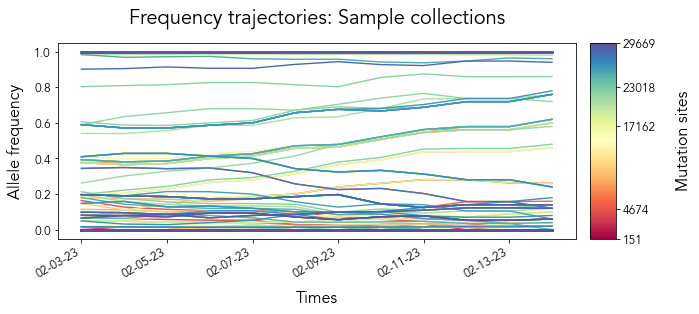

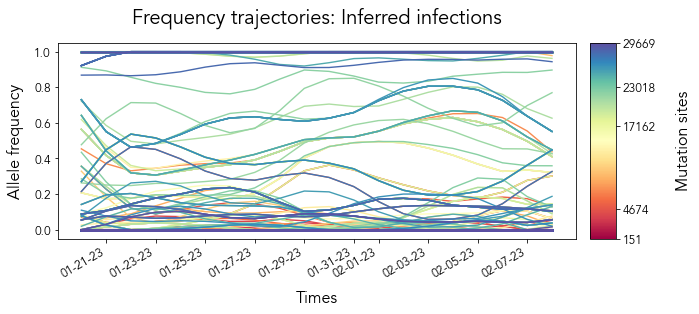

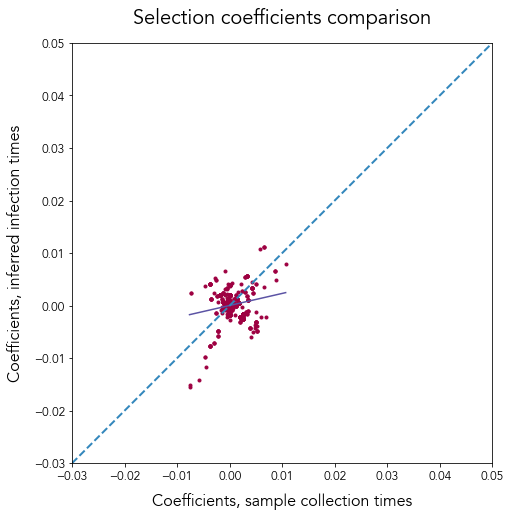

LinregressResult(slope=0.22930387133598132, intercept=2.733351985322855e-05, rvalue=0.19039997639170111, pvalue=1.0251824230694404e-21, stderr=0.023726727797050238, intercept_stderr=2.7441286931350587e-05)


In [6]:
fig1, fig2, fig3 = plot_wrap(17, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)

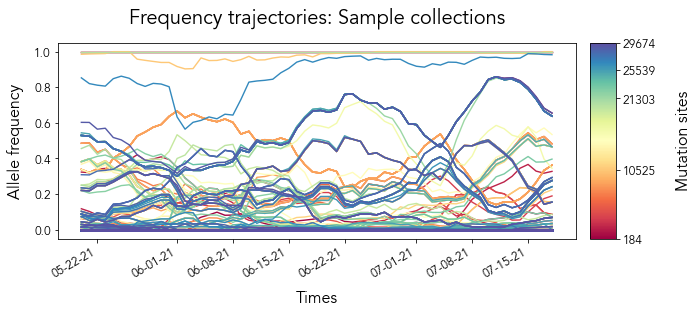

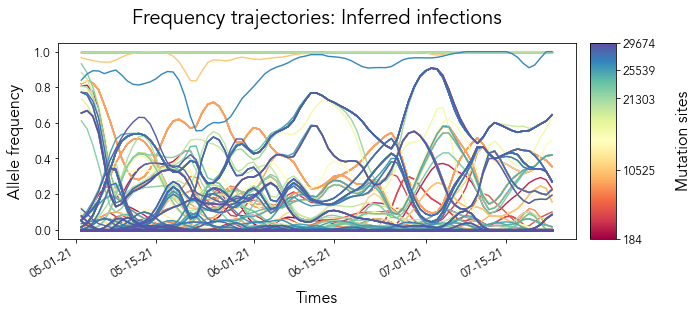

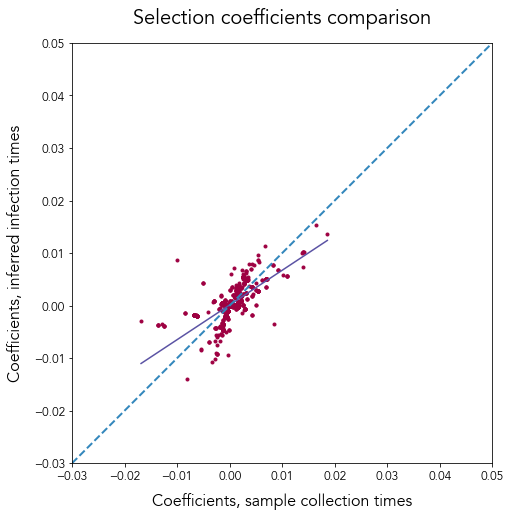

LinregressResult(slope=0.6605437580718485, intercept=0.00012252112151728145, rvalue=0.6989334093554568, pvalue=0.0, stderr=0.012654190475968139, intercept_stderr=2.4276190152203905e-05)


In [7]:
fig1, fig2, fig3 = plot_wrap(76, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)

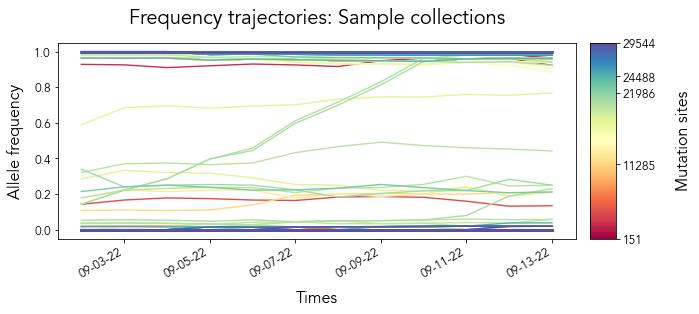

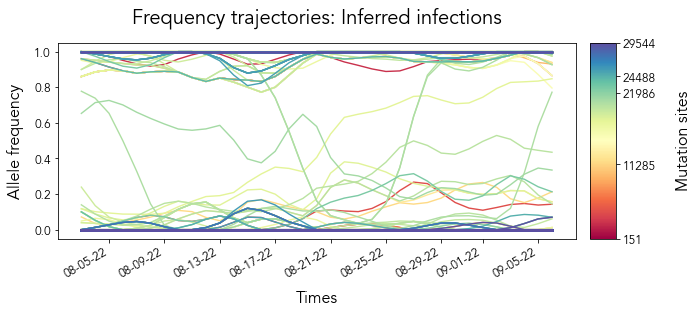

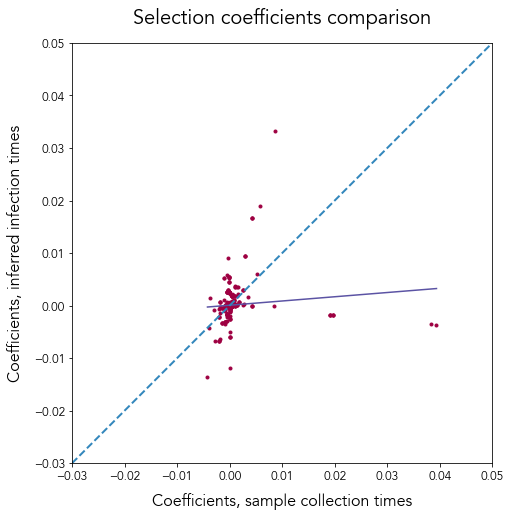

LinregressResult(slope=0.0806321478799878, intercept=7.506217302114055e-05, rvalue=0.0948823643624552, pvalue=3.199322624657439e-05, stderr=0.019342004905774604, intercept_stderr=3.3928273178403344e-05)


In [128]:
fig1, fig2, fig3 = plot_wrap(24, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)

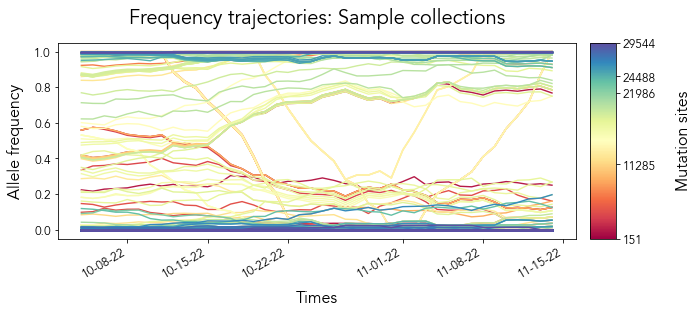

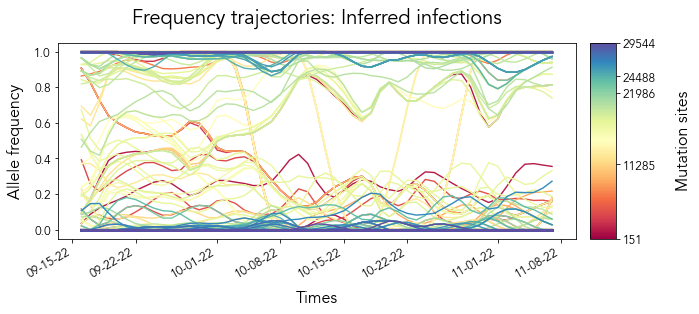

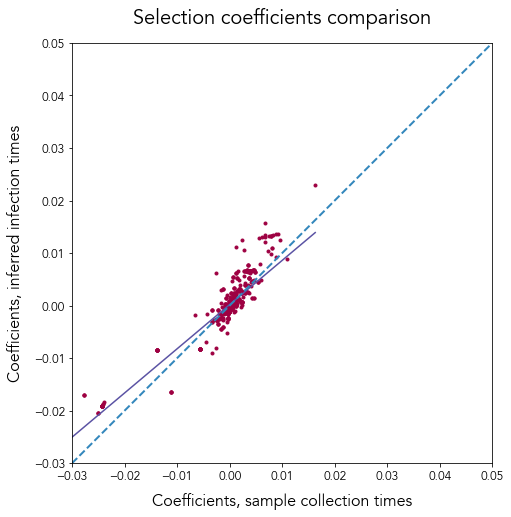

LinregressResult(slope=0.8412867478968112, intercept=0.0001932890891402223, rvalue=0.944119281263146, pvalue=0.0, stderr=0.006715094692254587, intercept_stderr=2.9645621813023213e-05)


In [129]:
fig1, fig2, fig3 = plot_wrap(25, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)

Enter the start value as integer or 0 for entire trajectory: 0
Enter the end value as integer or 0 for entire trajectory: 0


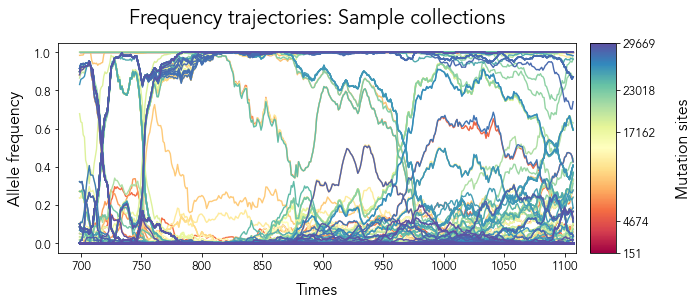

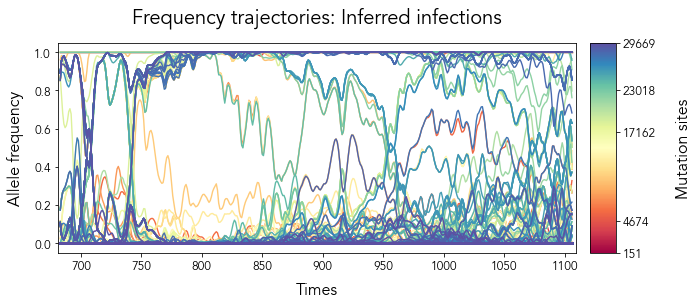

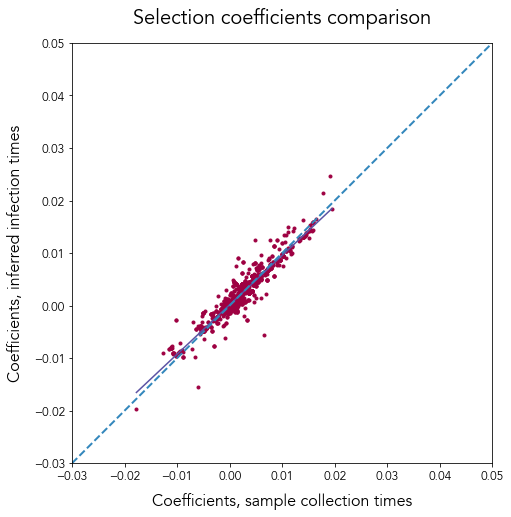

LinregressResult(slope=0.9404216615373164, intercept=0.00015832998893173362, rvalue=0.9593123716055136, pvalue=0.0, stderr=0.00555465701394936, intercept_stderr=2.1766032616172233e-05)


In [118]:
fig1, fig2, fig3 = plot_times_wrap(15, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)

Enter the start value as integer or 0 for entire trajectory: 0
Enter the end value as integer or 0 for entire trajectory: 0


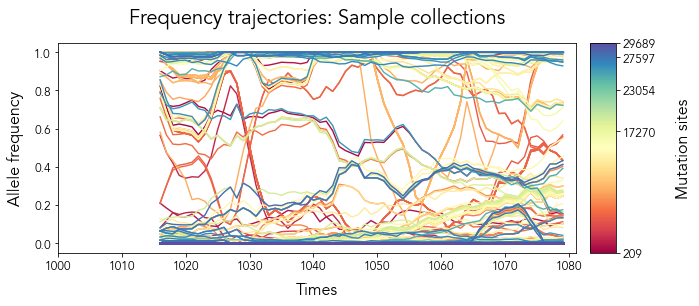

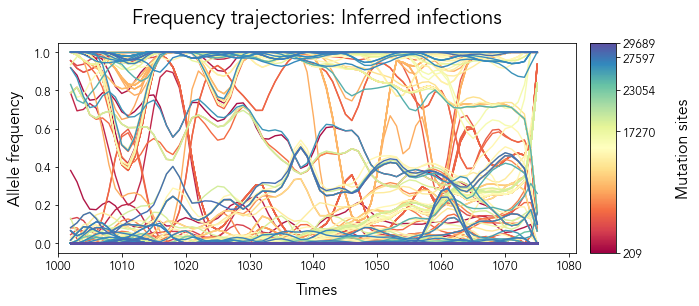

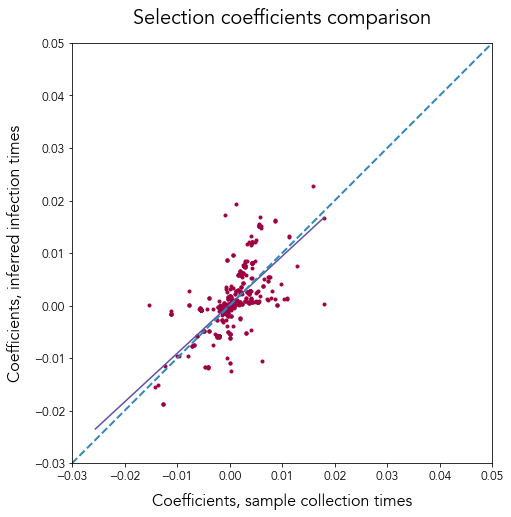

LinregressResult(slope=0.9246896586360557, intercept=0.00015489514817797797, rvalue=0.6707367196647085, pvalue=6.448341970944058e-287, stderr=0.0218348524459963, intercept_stderr=4.759714254219888e-05)


In [105]:
fig1, fig2, fig3 = plot_times_wrap(64, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)

Enter the start value as integer or 0 for entire trajectory: 0
Enter the end value as integer or 0 for entire trajectory: 0


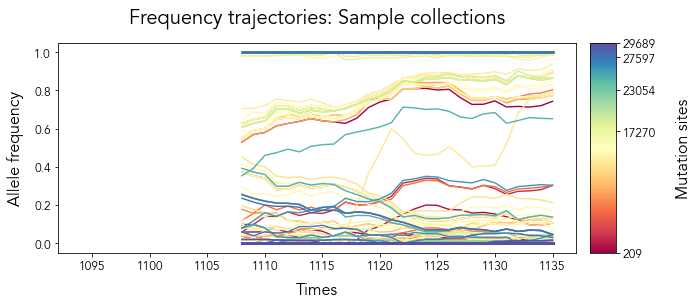

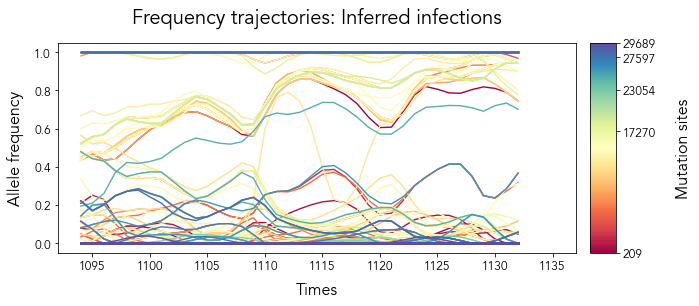

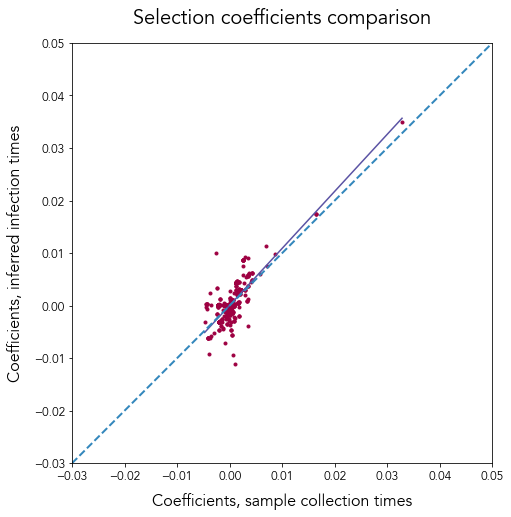

LinregressResult(slope=1.0854057541687834, intercept=4.758181436561802e-05, rvalue=0.7907505967947088, pvalue=0.0, stderr=0.017942499455188617, intercept_stderr=2.267627987499064e-05)


In [104]:
fig1, fig2, fig3 = plot_times_wrap(65, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)

Enter the start value as integer or 0 for entire trajectory: 0
Enter the end value as integer or 0 for entire trajectory: 0


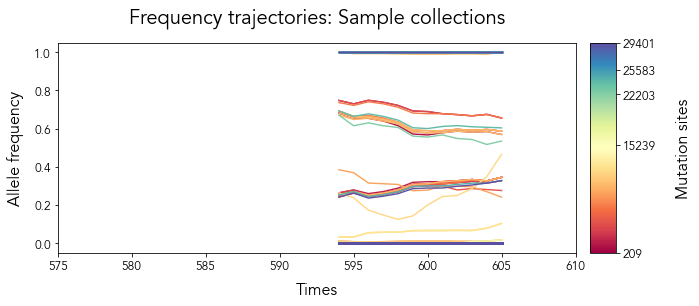

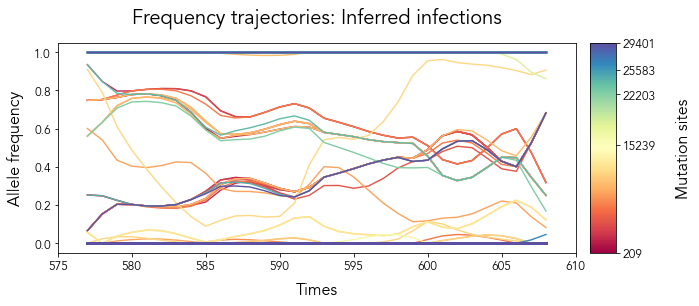

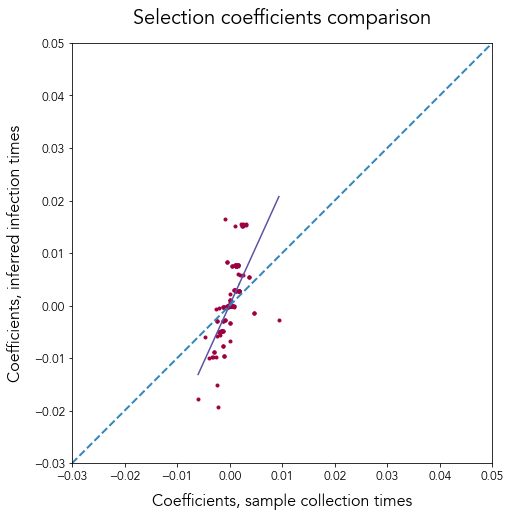

LinregressResult(slope=2.202264176972864, intercept=0.00010996265740114154, rvalue=0.6457855055917144, pvalue=1.5630280736742316e-98, stderr=0.09076135781528065, intercept_stderr=7.545209296495261e-05)


In [87]:
fig1, fig2, fig3 = plot_times_wrap(2, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)

Enter the start value as integer or 0 for entire trajectory: 0
Enter the end value as integer or 0 for entire trajectory: 0


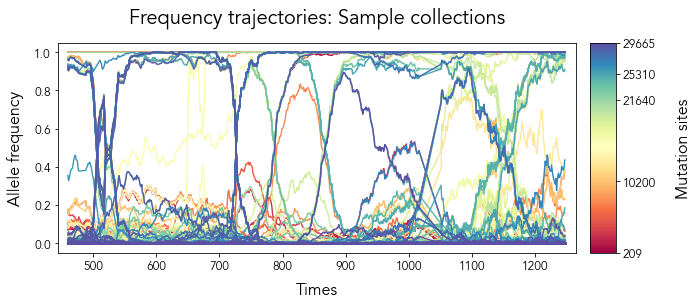

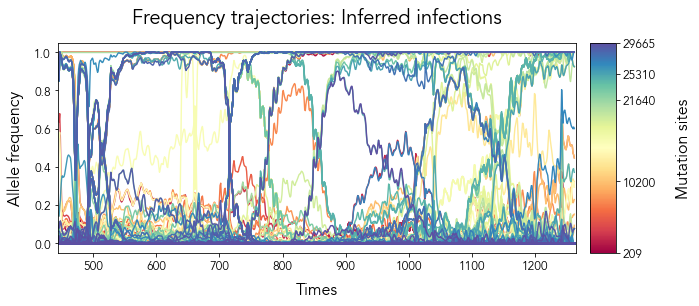

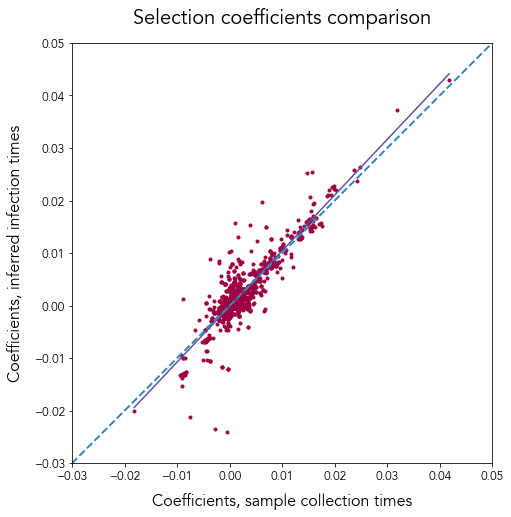

LinregressResult(slope=1.0596962732949253, intercept=-0.0001505687668090891, rvalue=0.9144415853630241, pvalue=0.0, stderr=0.010401816159541605, intercept_stderr=5.09342227615404e-05)


In [119]:
fig1, fig2, fig3 = plot_times_wrap(53, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)

Enter the start value as integer or 0 for entire trajectory: 0
Enter the end value as integer or 0 for entire trajectory: 480


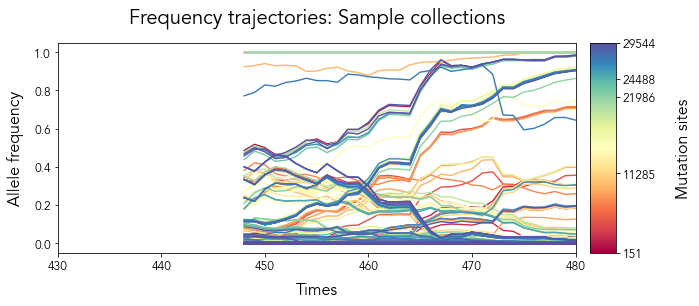

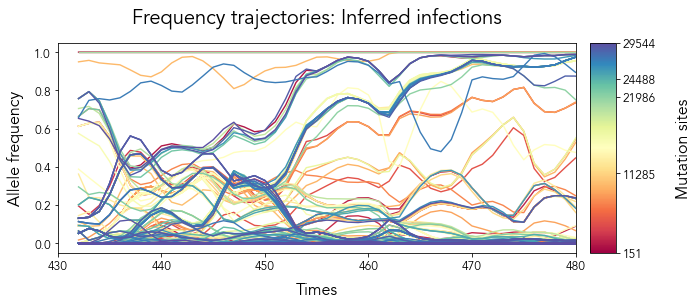

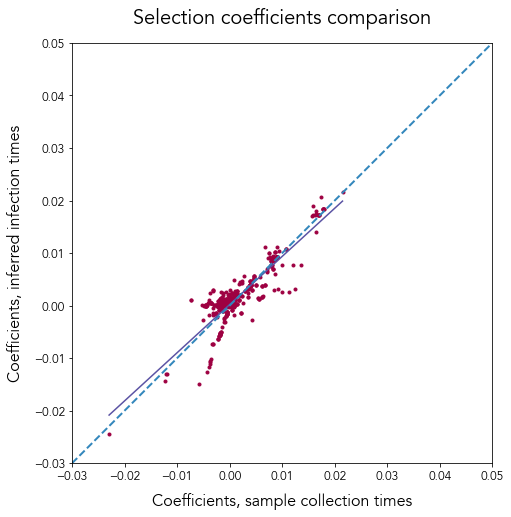

LinregressResult(slope=0.9166907057697155, intercept=0.0001968334773679925, rvalue=0.9024229367131826, pvalue=0.0, stderr=0.01000650982871158, intercept_stderr=2.9214184524767274e-05)


In [122]:
fig1, fig2, fig3 = plot_times_wrap(21, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)

Enter the start value as integer or 0 for entire trajectory: 0
Enter the end value as integer or 0 for entire trajectory: 0


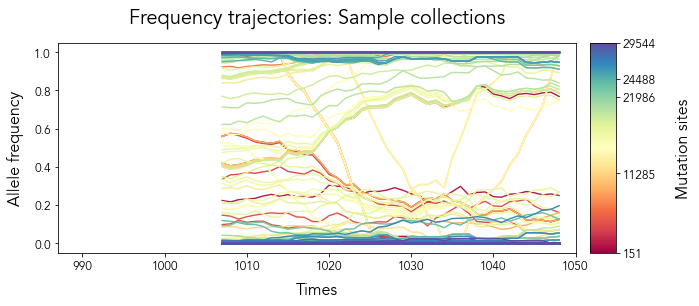

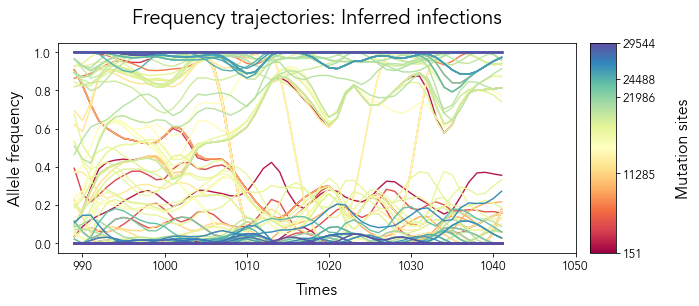

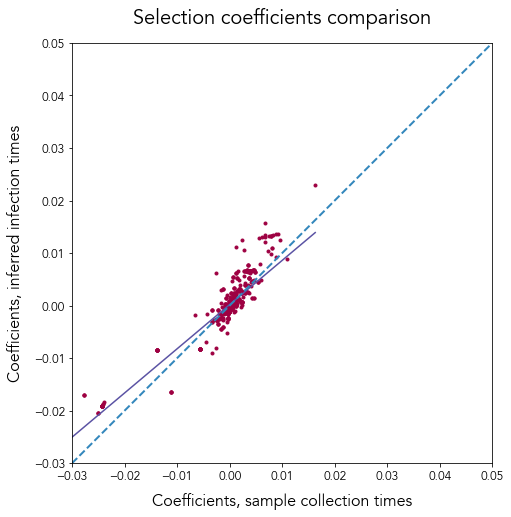

LinregressResult(slope=0.8412867478968112, intercept=0.0001932890891402223, rvalue=0.944119281263146, pvalue=0.0, stderr=0.006715094692254587, intercept_stderr=2.9645621813023213e-05)


In [127]:
fig1, fig2, fig3 = plot_times_wrap(25, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)

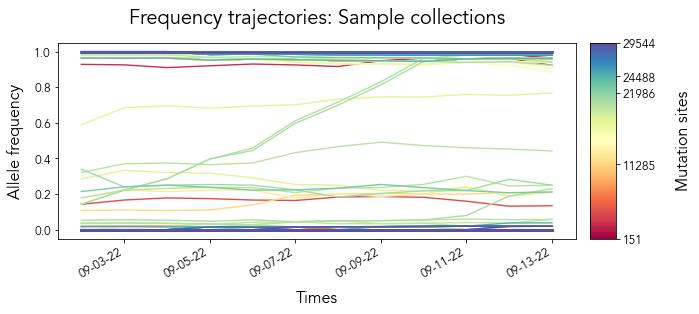

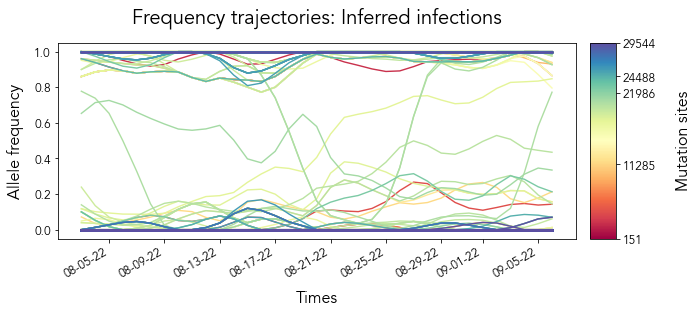

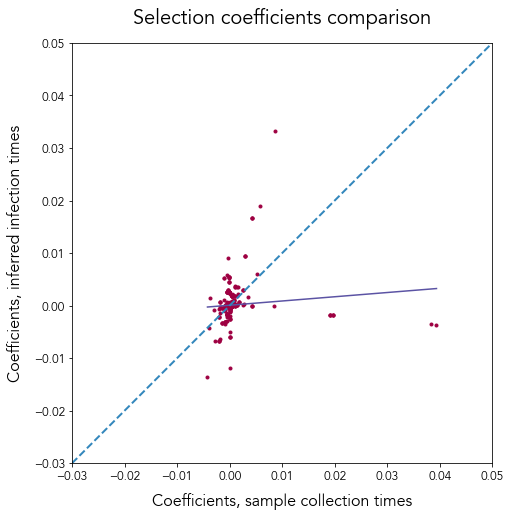

LinregressResult(slope=0.0806321478799878, intercept=7.506217302114055e-05, rvalue=0.0948823643624552, pvalue=3.199322624657439e-05, stderr=0.019342004905774604, intercept_stderr=3.3928273178403344e-05)


In [124]:
fig1, fig2, fig3 = plot_wrap(24, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)

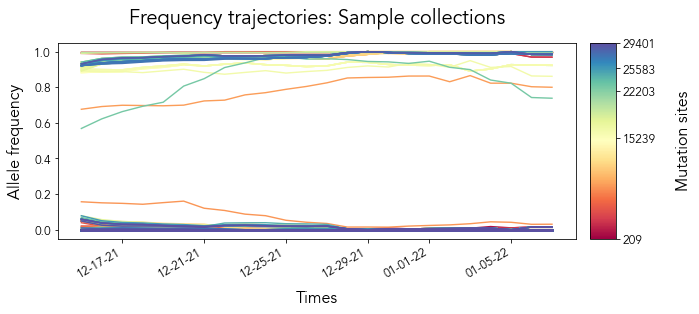

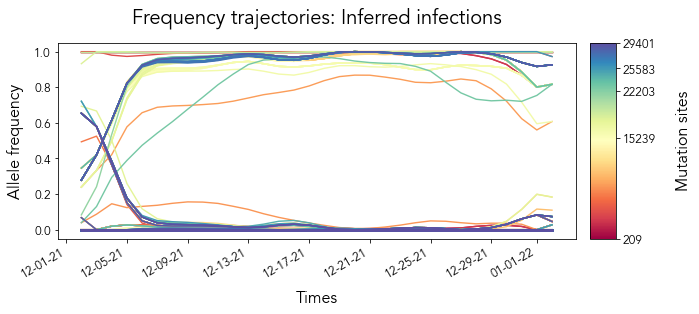

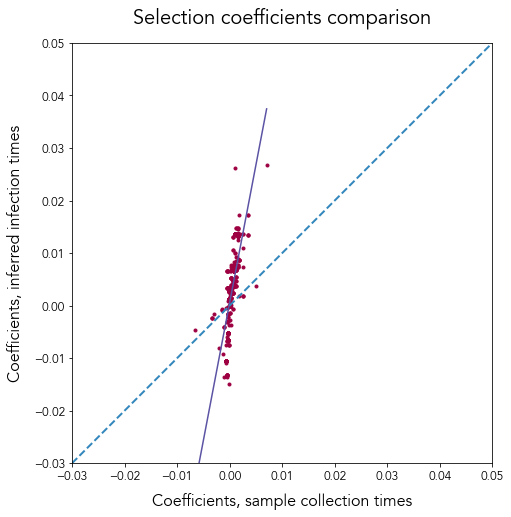

LinregressResult(slope=5.242413445421102, intercept=0.0005368459464822001, rvalue=0.7177039191323045, pvalue=1.7137291902479058e-131, stderr=0.17730158218307998, intercept_stderr=0.0001472846349890924)


In [29]:
fig1, fig2, fig3 = plot_wrap(4, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)

saving plot to: /Users/liz/Documents/GitHub/paper-epi-backprojection/figures/covar_ppt_Transmissions_4.pdf
saving plot to: /Users/liz/Documents/GitHub/paper-epi-backprojection/figures/covar_ppt_Inferred_Infections_4.pdf
saving plot to: /Users/liz/Documents/GitHub/paper-epi-backprojection/figures/inf_ppt_4.pdf
LinregressResult(slope=5.242413445421102, intercept=0.0005368459464822001, rvalue=0.7177039191323045, pvalue=1.7137291902479058e-131, stderr=0.17730158218307998, intercept_stderr=0.0001472846349890924)


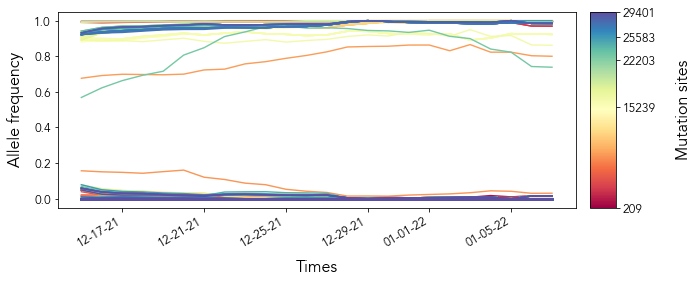

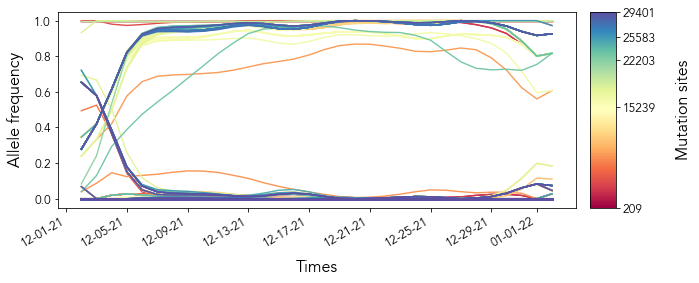

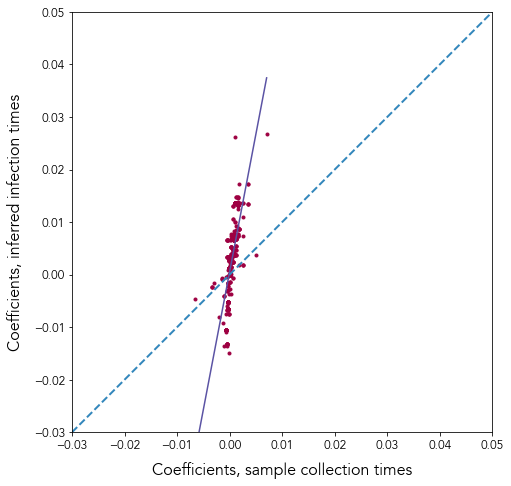

In [20]:
fig1, fig2, fig3 = plot_save_wrap(4, home_dir, inf_plot_home, inf_plot_bp_home, plot_save_inf)

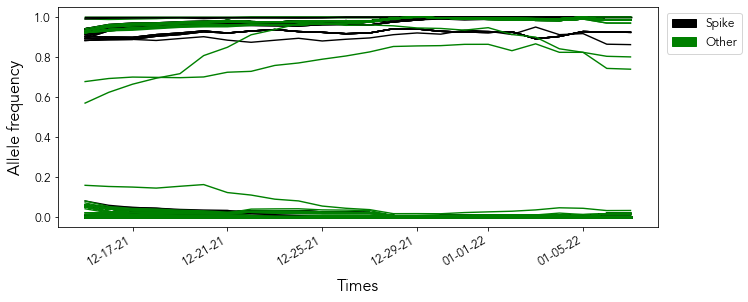

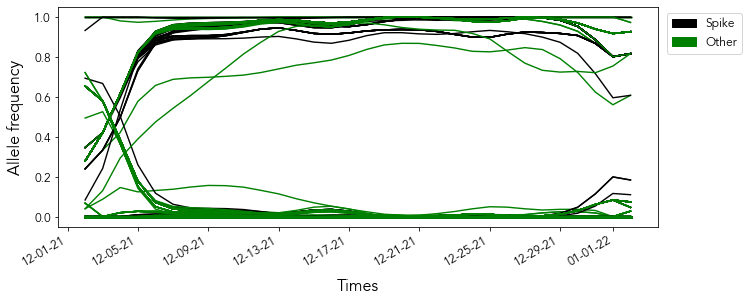

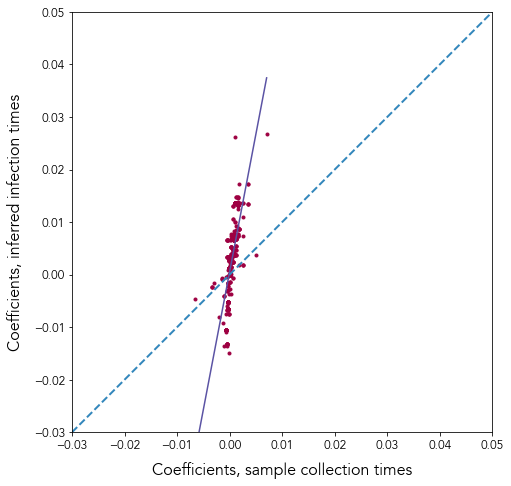

LinregressResult(slope=5.242413445421102, intercept=0.0005368459464822001, rvalue=0.7177039191323045, pvalue=1.7137291902479058e-131, stderr=0.17730158218307998, intercept_stderr=0.0001472846349890924)


In [8]:
%matplotlib inline

fig1, fig2, fig3 = plot_spike_wrap(4, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)

saving plot to: /Users/liz/Documents/GitHub/paper-epi-backprojection/figures/covar_ppt_spike_Transmissions_4.pdf
saving plot to: /Users/liz/Documents/GitHub/paper-epi-backprojection/figures/covar_ppt_spike_Inferred_Infections_4.pdf
saving plot to: /Users/liz/Documents/GitHub/paper-epi-backprojection/figures/inf_ppt_4.pdf
LinregressResult(slope=5.242413445421102, intercept=0.0005368459464822001, rvalue=0.7177039191323045, pvalue=1.7137291902479058e-131, stderr=0.17730158218307998, intercept_stderr=0.0001472846349890924)


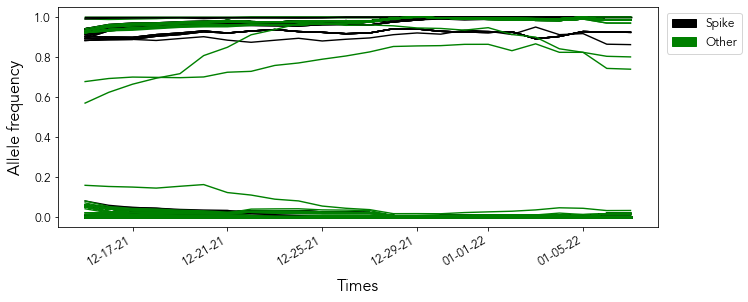

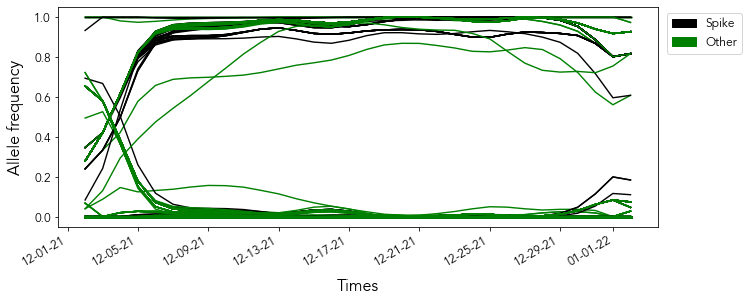

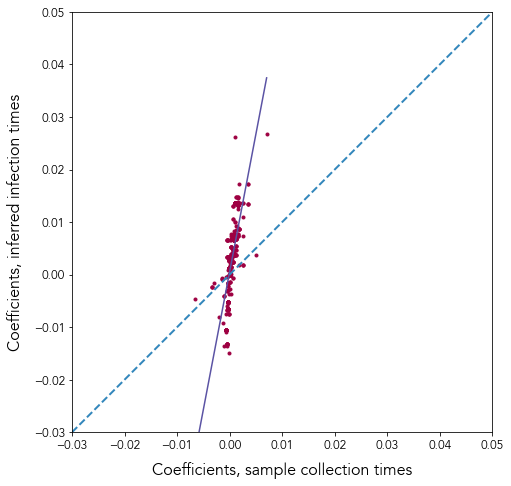

In [11]:
fig1, fig2, fig3 = plot_save_spike_wrap(4, home_dir, inf_plot_home, inf_plot_bp_home, plot_save_inf)

saving plot to: /Users/liz/Documents/GitHub/paper-epi-backprojection/figures/covar_ppt_Transmissions_13.pdf
saving plot to: /Users/liz/Documents/GitHub/paper-epi-backprojection/figures/covar_ppt_Inferred_Infections_13.pdf
saving plot to: /Users/liz/Documents/GitHub/paper-epi-backprojection/figures/inf_ppt_13.pdf
LinregressResult(slope=2.456811489160354, intercept=7.75992765584201e-05, rvalue=0.8859872737789823, pvalue=0.0, stderr=0.02580489136050099, intercept_stderr=1.9040695261985683e-05)


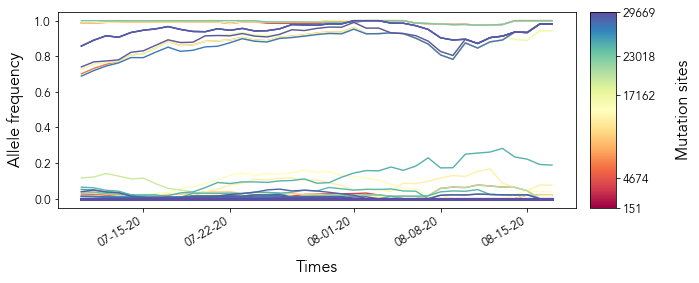

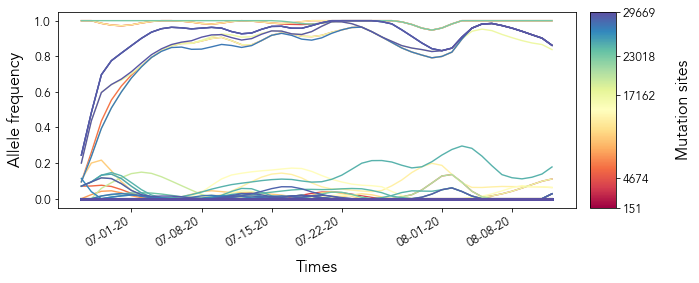

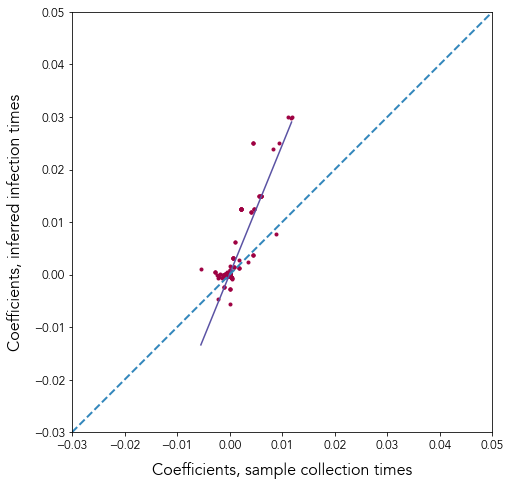

In [21]:
fig1, fig2, fig3 = plot_save_wrap(13, home_dir, inf_plot_home, inf_plot_bp_home, plot_save_inf)

<IPython.core.display.Javascript object>


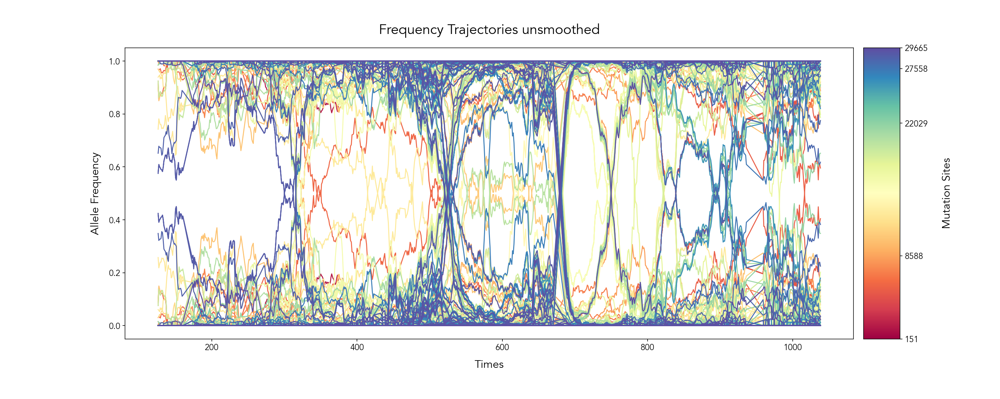

<IPython.core.display.Javascript object>


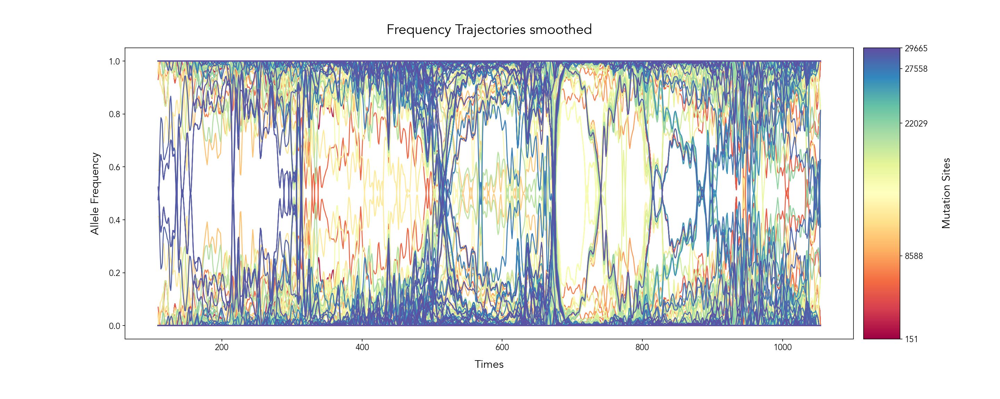

<IPython.core.display.Javascript object>


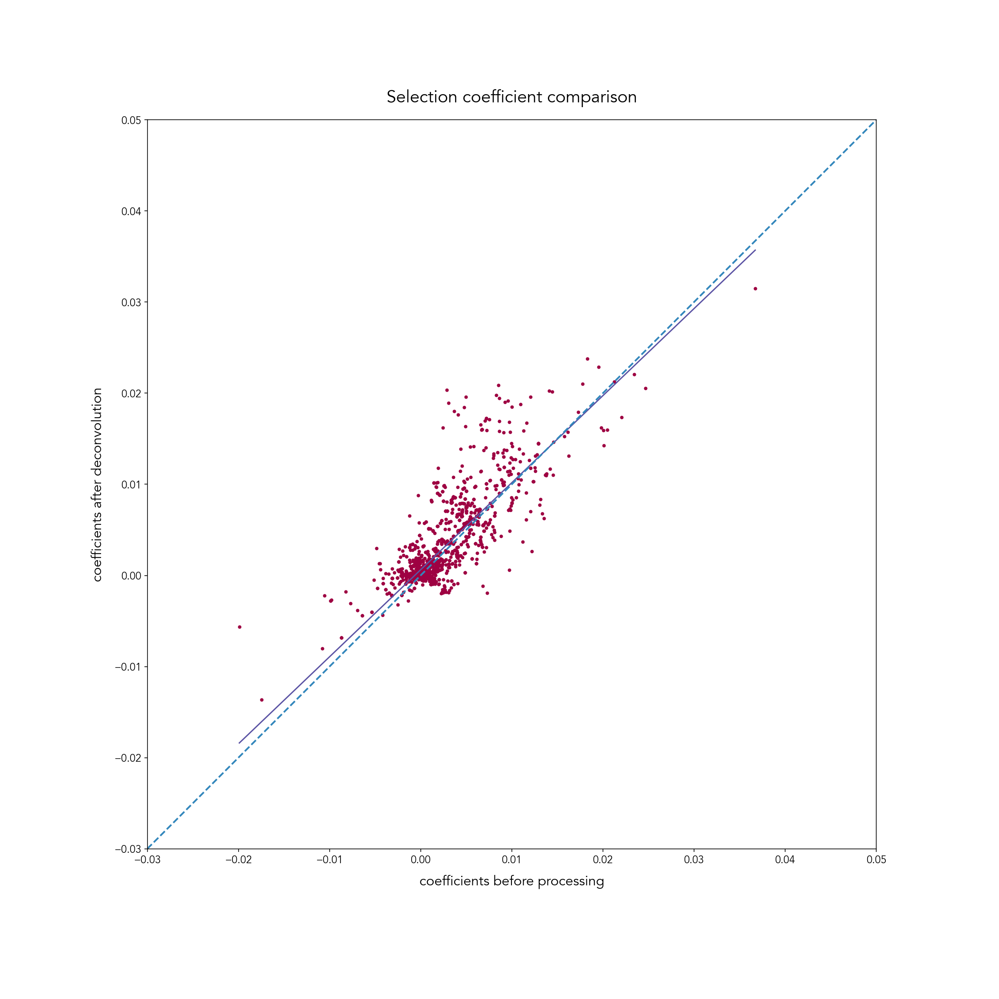

LinregressResult(slope=0.955276591778143, intercept=0.0006223131876729804, rvalue=0.8204990361436986, pvalue=0.0, stderr=0.013479160020083526, intercept_stderr=5.0958298119301085e-05)


In [11]:
%matplotlib notebook

fig1, fig2, fig3 = plot_wrap(11, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)

<IPython.core.display.Javascript object>


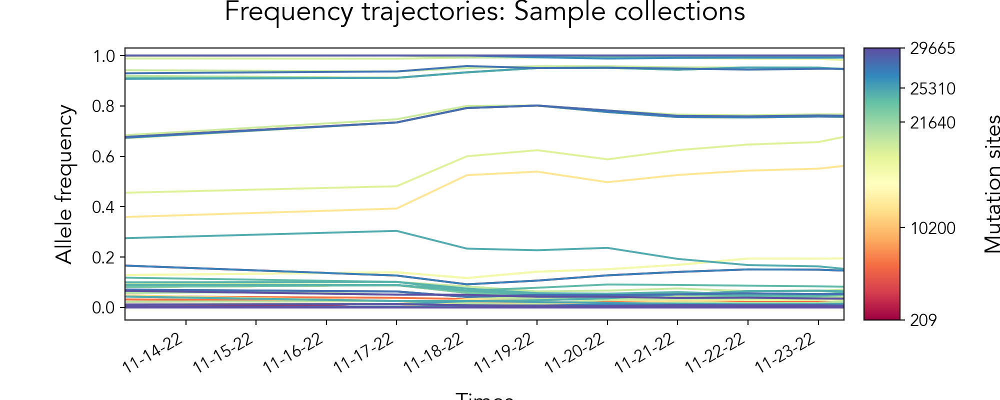

<IPython.core.display.Javascript object>


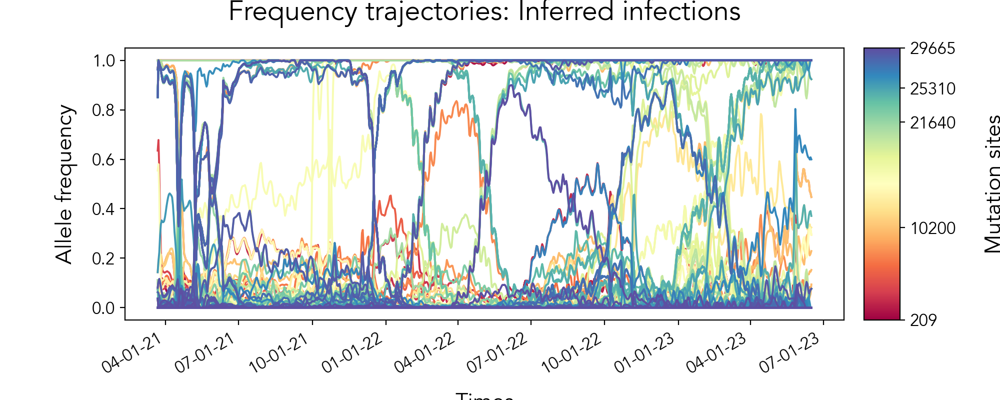

<IPython.core.display.Javascript object>


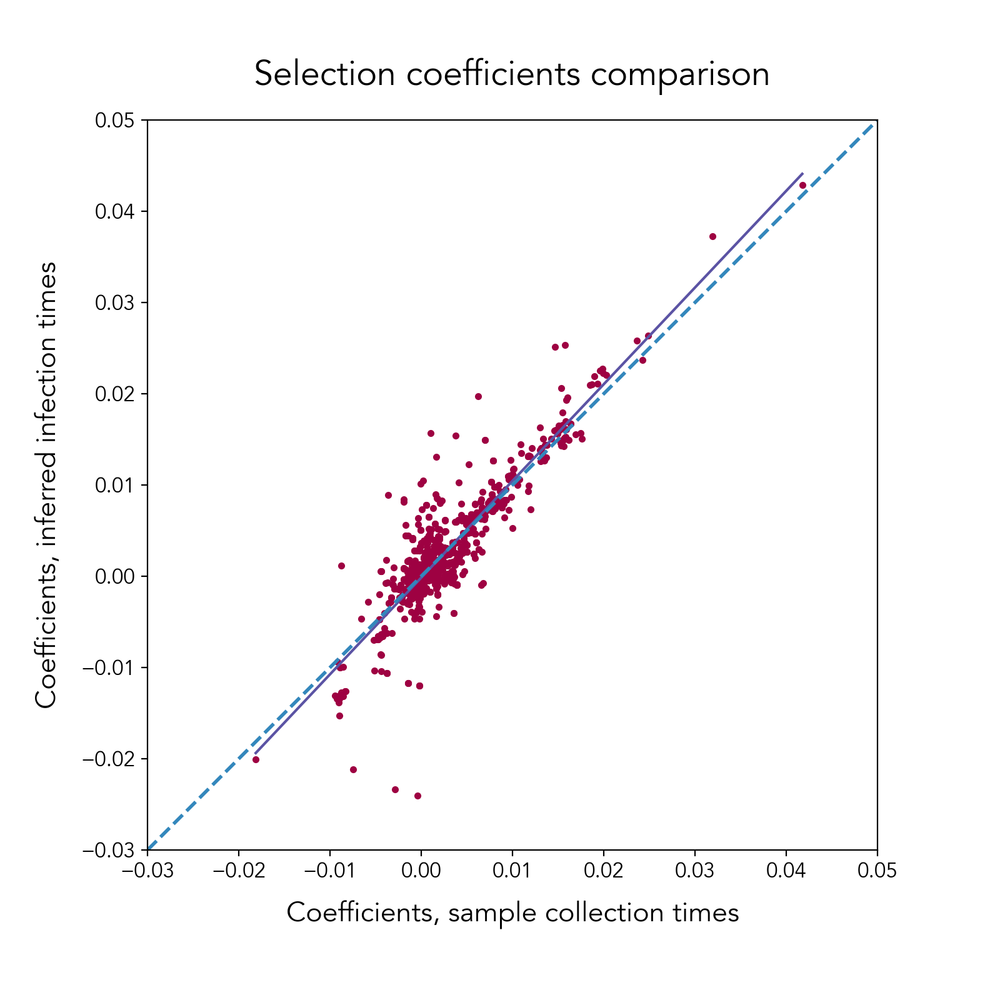

LinregressResult(slope=1.0596962732949253, intercept=-0.0001505687668090891, rvalue=0.9144415853630241, pvalue=0.0, stderr=0.010401816159541605, intercept_stderr=5.09342227615404e-05)


In [3]:
%matplotlib notebook

fig1, fig2, fig3 = plot_wrap(53, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)

Below are different ways to view data

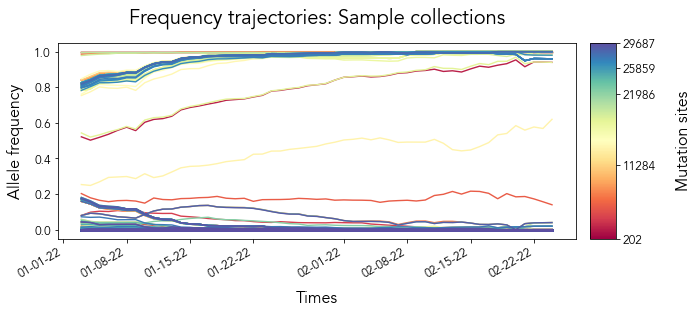

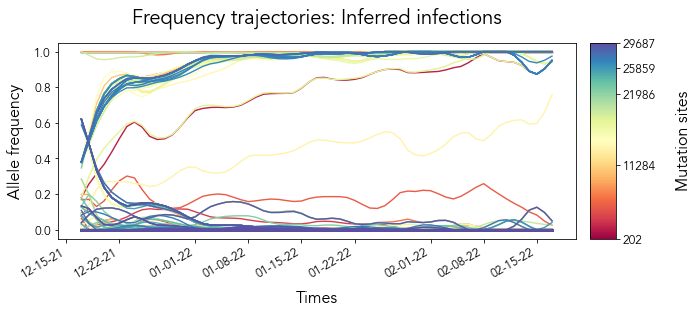

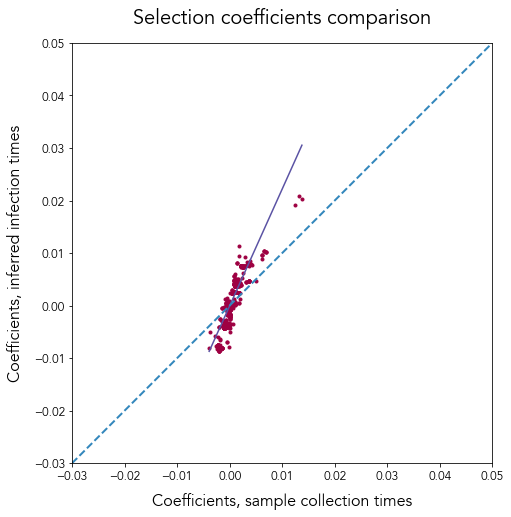

LinregressResult(slope=2.222984589452873, intercept=-5.1621537102829835e-05, rvalue=0.8824821056346607, pvalue=0.0, stderr=0.028668438590459727, intercept_stderr=3.4159427989405915e-05)
Press Enter to continue or q to quit: 


In [30]:
from IPython.display import clear_output
%matplotlib inline

for i in range(0, 108):
    if i == 29:
        continue
    fig1, fig2, fig3 = plot_wrap(i, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)
    user_input = input("Press Enter to continue or q to quit: ")
    if user_input.lower() == 'q':
        break
    clear_output(wait=True)
    plt.close(fig1)
    plt.close(fig2)
    plt.close(fig3)

In [34]:
from IPython.display import clear_output
%matplotlib inline

while True:
    try:
        user_input = input("Enter an index from 0 to 108 or q to quit: ")
        if user_input.lower() == 'q':
            break
        index = int(user_input)
        if 0 <= index <= 108:
            fig1, fig2, fig3 = plot_wrap(index, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)
            clear_output(wait=True)
            plt.close(fig1)
            plt.close(fig2)
            plt.close(fig3)
        else:
            print("Invalid index")
    except ValueError:
        print("Invalid input")

Enter an index from 0 to 108 or q to quit: q


In [541]:
#Africa

Cameroon = [0]
Kenya = [1,2,3,4]
Reunion = [5,6,7,8,9,10]
SouthAfrica = [11,12]

#Asia

HongKong = [13,14,15,16,17,18]
Gujarat = [19,20,21,22,23,24,25,26]
Karnataka = [27,28]
Indonesia = [29] #broken
Vietnam = [30,31,32,33,34]

#Europe

BosniaHerzegovina = [35,36,37]
Croatia = [38,39,40]
Cyprus = [41,42,43,44,45]
Estonia = [46,47,48]
Latvia = [49]
Portugal = [50,51,52,53]
Romania = [54,55,56,57,58,59]
Moscow = [60,61,62,63,64,65]
Slovakia = [66,67]

#North America

Manitoba = [68,69,70,71,72,73,74,75,76,77,78,79,80]
Quebec = [81,82,83,84,85]
CostaRica = [86]
Jamaica = [87,88,89]
MexicoCity = [90,91,92,93]
NuevoLeon = [94,95,96]
Panama = [97,98,99]
PuertoRico = [100,101,102,103,104,105]
Wyoming = [106,107]

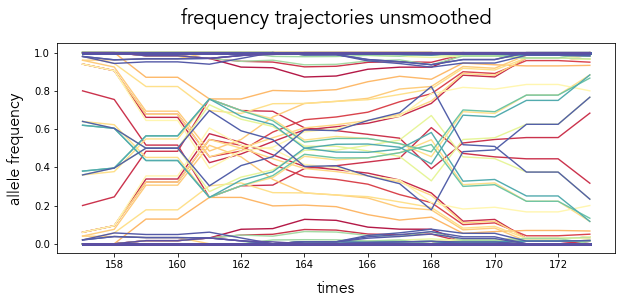

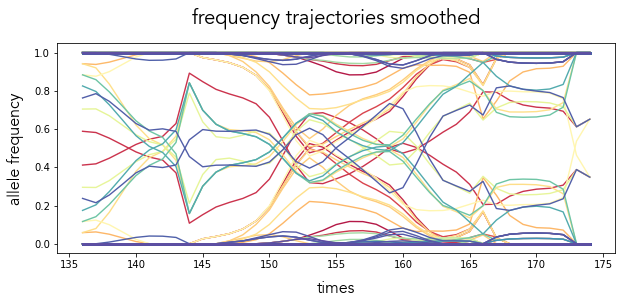

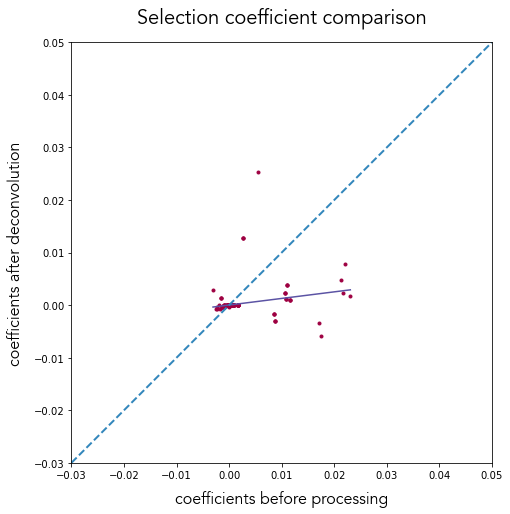

LinregressResult(slope=0.1252306275575591, intercept=1.9944704136850407e-05, rvalue=0.22794173940239482, pvalue=5.432291741258661e-24, stderr=0.012230469582370658, intercept_stderr=1.9019318046559983e-05)


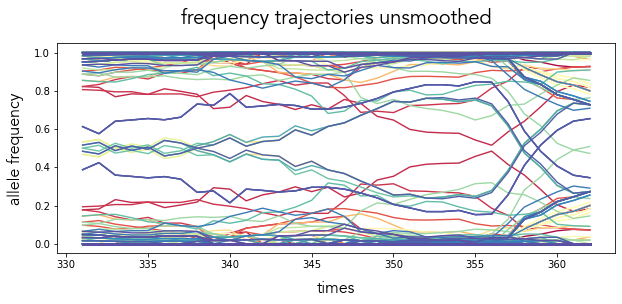

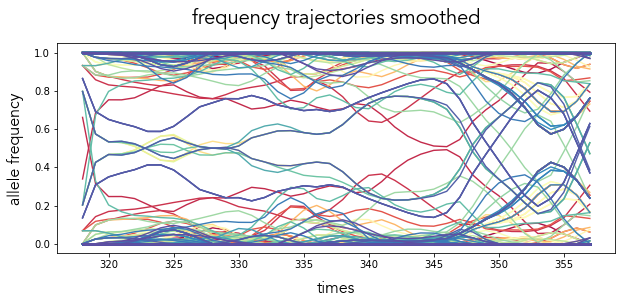

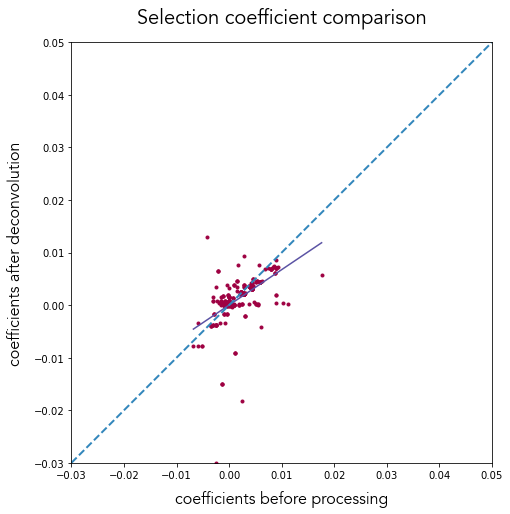

LinregressResult(slope=0.67339828151463, intercept=1.7250780596915732e-05, rvalue=0.6197905133551255, pvalue=1.2816211372846207e-203, stderr=0.019494427881806935, intercept_stderr=3.2068184357699685e-05)


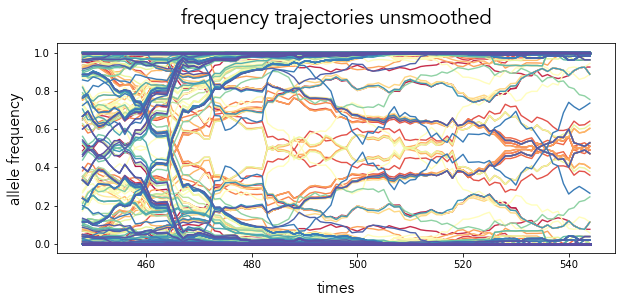

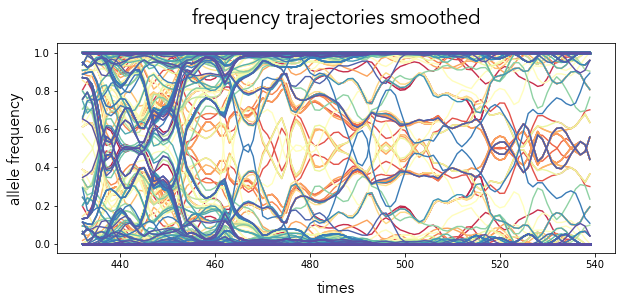

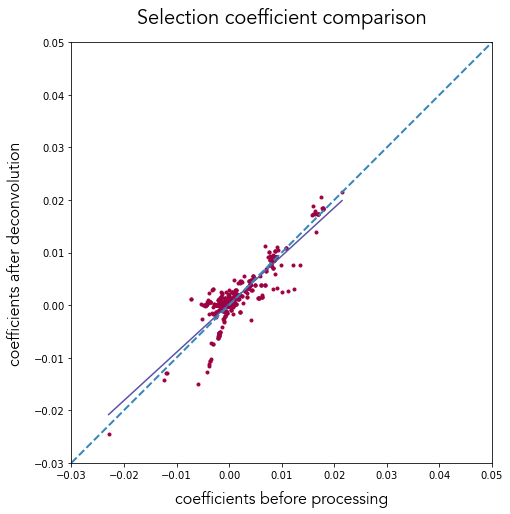

LinregressResult(slope=0.9166907057697155, intercept=0.0001968334773679925, rvalue=0.9024229367131826, pvalue=0.0, stderr=0.01000650982871158, intercept_stderr=2.9214184524767274e-05)


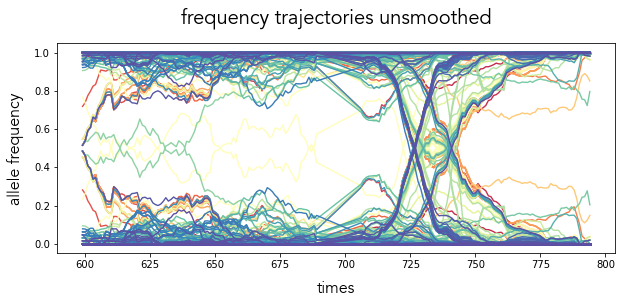

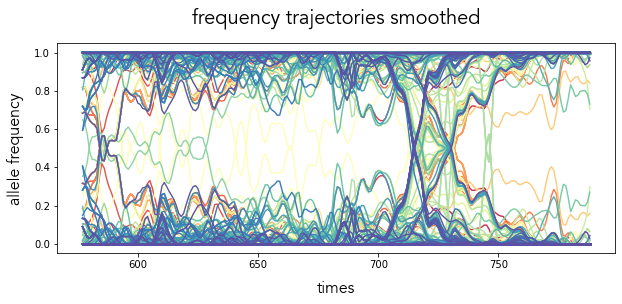

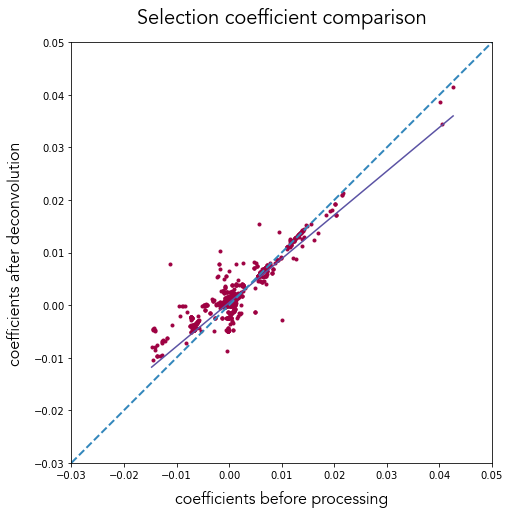

LinregressResult(slope=0.8331909264015641, intercept=0.0004866711774372225, rvalue=0.9213310811706663, pvalue=0.0, stderr=0.008038481550605926, intercept_stderr=3.79028985187325e-05)


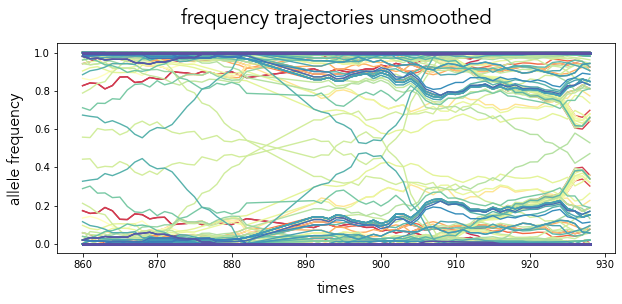

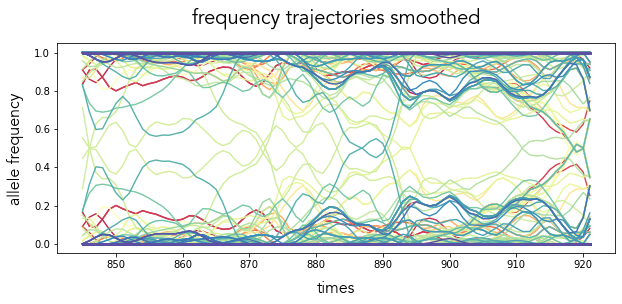

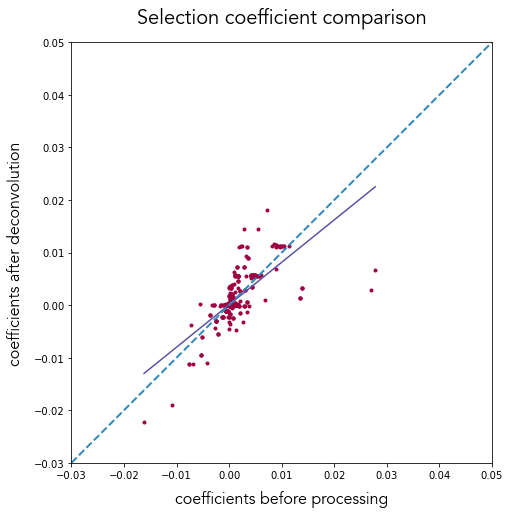

LinregressResult(slope=0.8070878799591649, intercept=7.57711327427435e-05, rvalue=0.7202828965782341, pvalue=3.478039944013186e-306, stderr=0.01777131991701621, intercept_stderr=3.2902948996635674e-05)


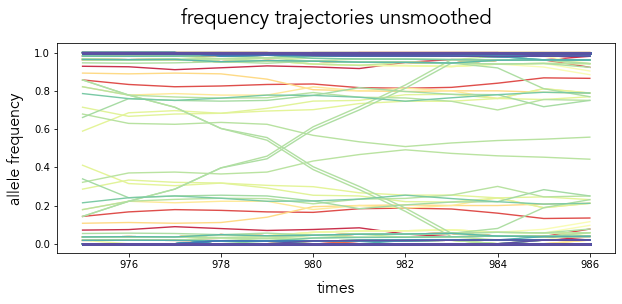

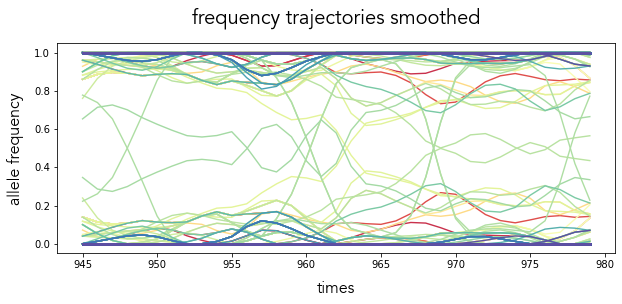

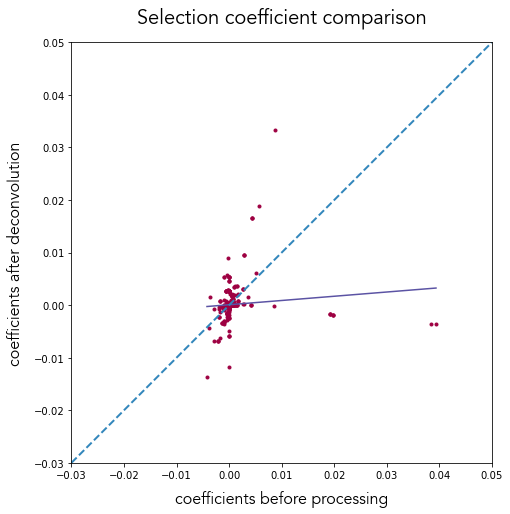

LinregressResult(slope=0.0806321478799878, intercept=7.506217302114055e-05, rvalue=0.0948823643624552, pvalue=3.199322624657439e-05, stderr=0.019342004905774604, intercept_stderr=3.3928273178403344e-05)


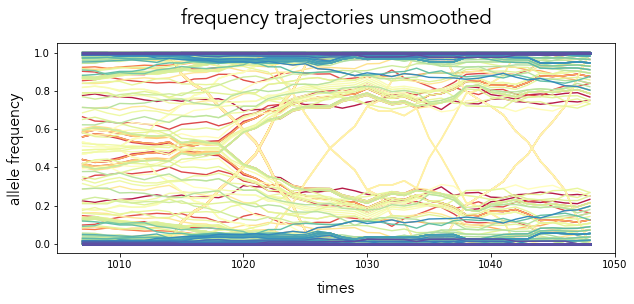

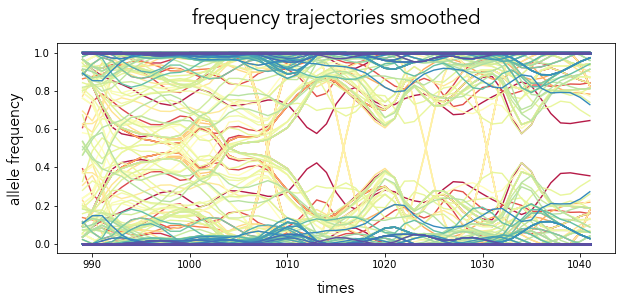

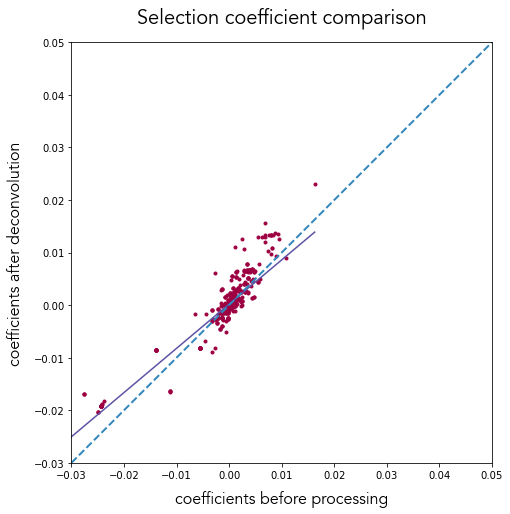

LinregressResult(slope=0.8412867478968112, intercept=0.0001932890891402223, rvalue=0.944119281263146, pvalue=0.0, stderr=0.006715094692254587, intercept_stderr=2.9645621813023213e-05)


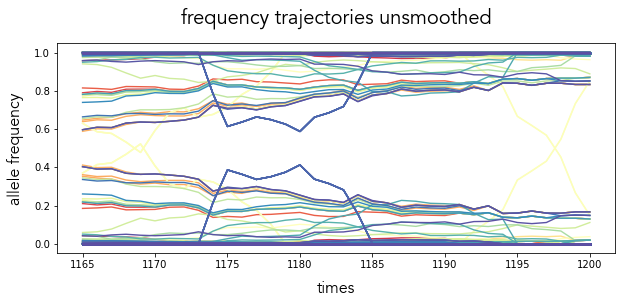

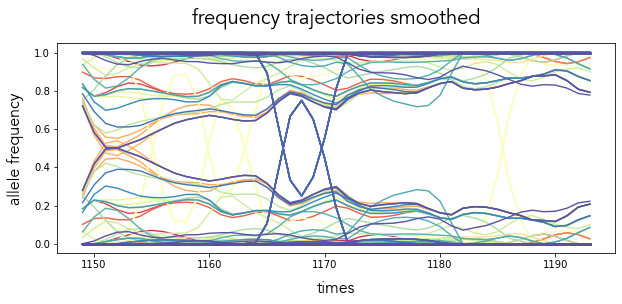

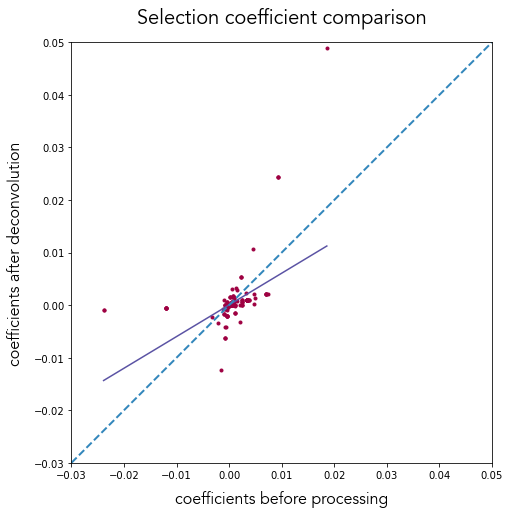

LinregressResult(slope=0.6025481455545553, intercept=4.615302441325404e-05, rvalue=0.5000587251361729, pvalue=1.0590012012086794e-121, stderr=0.023857607378376104, intercept_stderr=3.161429956387432e-05)


In [587]:
%matplotlib inline
for i in Gujarat:
    fig1, fig2, fig3 = plot_wrap(i, home_dir, inf_plot_redo_home, inf_plot_bp_home, plot_inf)

In [9]:
def get_region_plots():
    
    regions_dict = {
        # Africa
        "Cameroon": [0],
        "Kenya": [1, 2, 3, 4],
        "Reunion": [5, 6, 7, 8, 9, 10],
        "SouthAfrica": [11, 12],

        # Asia
        "HongKong": [13, 14, 15, 16, 17, 18],
        "Gujarat": [19, 20, 21, 22, 23, 24, 25, 26],
        "Karnataka": [27, 28],
        "Indonesia": [29],  # broken
        "Vietnam": [30, 31, 32, 33, 34],

        # Europe
        "BosniaHerzegovina": [35, 36, 37],
        "Croatia": [38, 39, 40],
        "Cyprus": [41, 42, 43, 44, 45],
        "Estonia": [46, 47, 48],
        "Latvia": [49],
        "Portugal": [50, 51, 52, 53],
        "Romania": [54, 55, 56, 57, 58, 59],
        "Moscow": [60, 61, 62, 63, 64, 65],
        "Slovakia": [66, 67],

        # North America
        "Manitoba": [68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80],
        "Quebec": [81, 82, 83, 84, 85],
        "CostaRica": [86],
        "Jamaica": [87, 88, 89],
        "MexicoCity": [90, 91, 92, 93],
        "NuevoLeon": [94, 95, 96],
        "Panama": [97, 98, 99],
        "PuertoRico": [100, 101, 102, 103, 104, 105],
        "Wyoming": [106, 107]
    }

    while True:
        region = input("Enter region or 'q' to quit (case-insensitive): ")

        if region.lower() == 'q':
            break
        
        selected_region = regions_dict.get(region.capitalize())

        if selected_region is None:
            available_regions = ", ".join(regions_dict.keys())
            print(f"Region not available. Available regions: {available_regions}")
        else:
            for i in selected_region:
                fig1, fig2, fig3 = plot_wrap(i, home_dir, inf_plot_home, inf_plot_bp_home, plot_inf)

Enter region or 'q' to quit (case-insensitive): Kenya


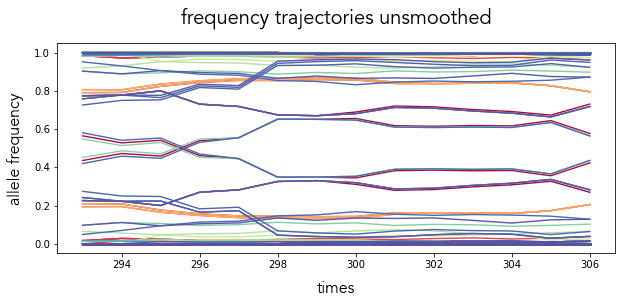

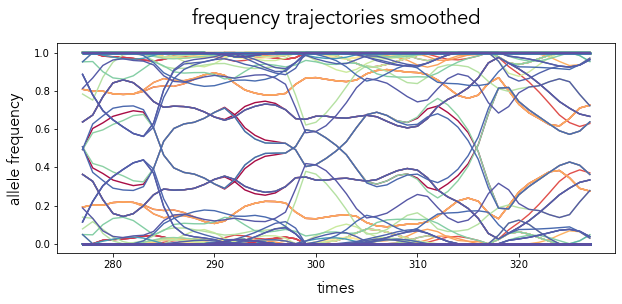

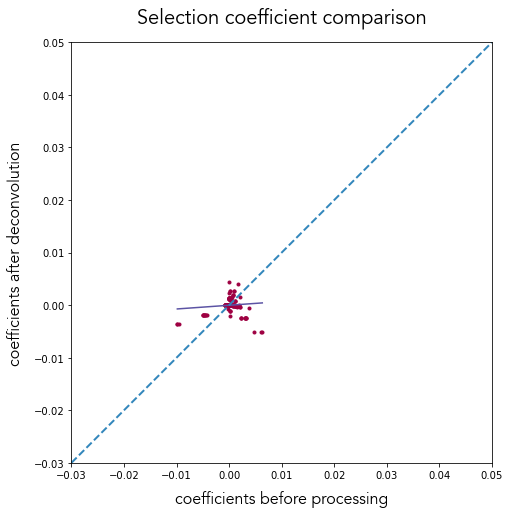

LinregressResult(slope=0.07083505129872569, intercept=-2.6377423239911696e-05, rvalue=0.10735012856370557, pvalue=0.002017464941466114, stderr=0.02286803139903502, intercept_stderr=2.2016626444889266e-05)


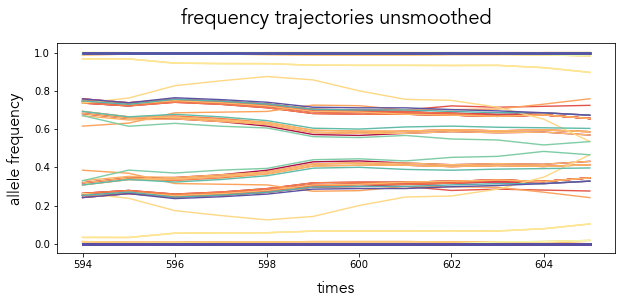

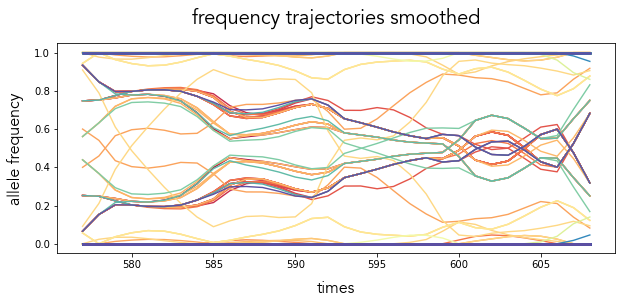

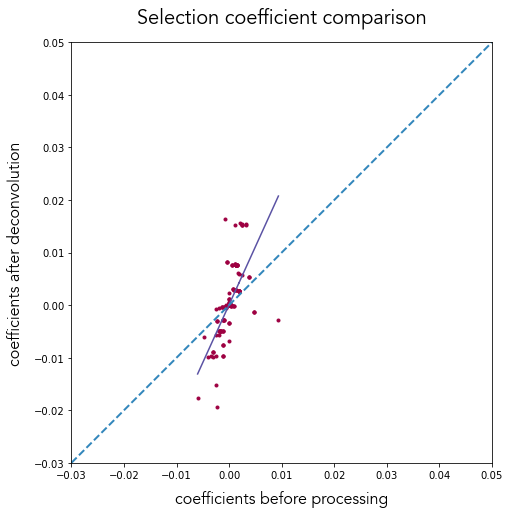

LinregressResult(slope=2.202264176972864, intercept=0.00010996265740114154, rvalue=0.6457855055917144, pvalue=1.5630280736742316e-98, stderr=0.09076135781528065, intercept_stderr=7.545209296495261e-05)


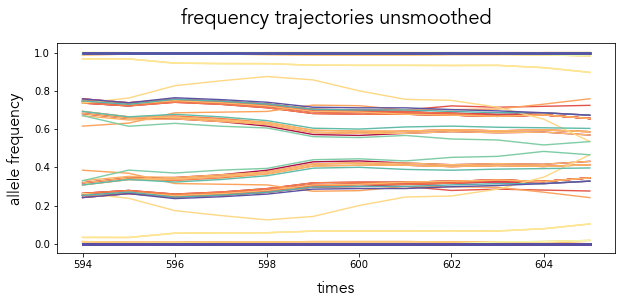

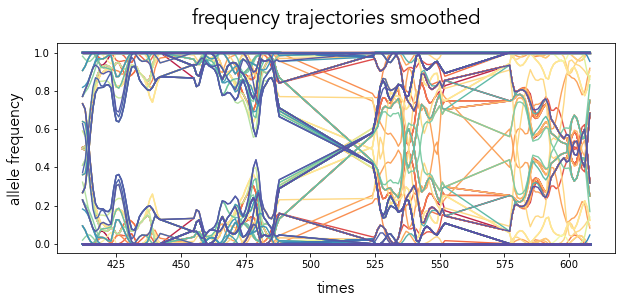

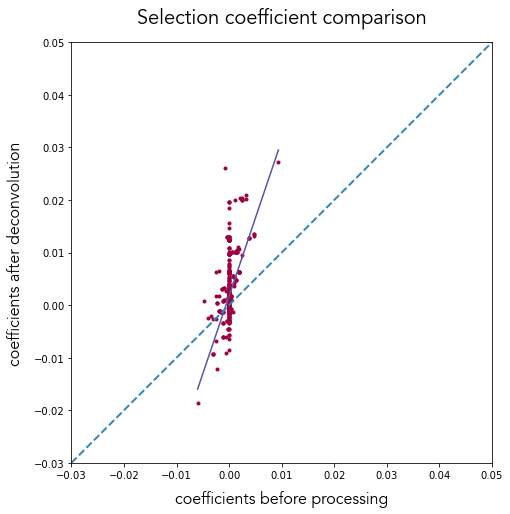

LinregressResult(slope=2.95931934918827, intercept=0.0017656184219996041, rvalue=0.5095827572522729, pvalue=1.0065355609503692e-55, stderr=0.174176083448133, intercept_stderr=0.0001447967544441836)


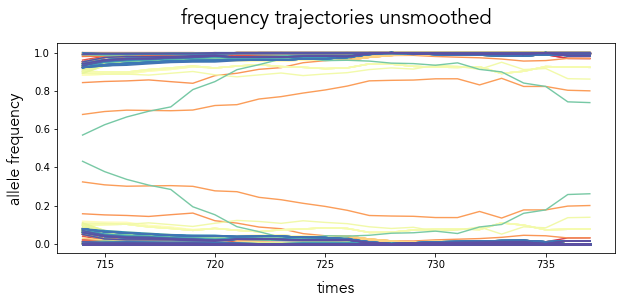

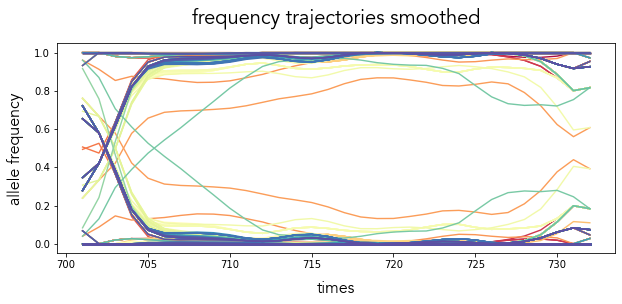

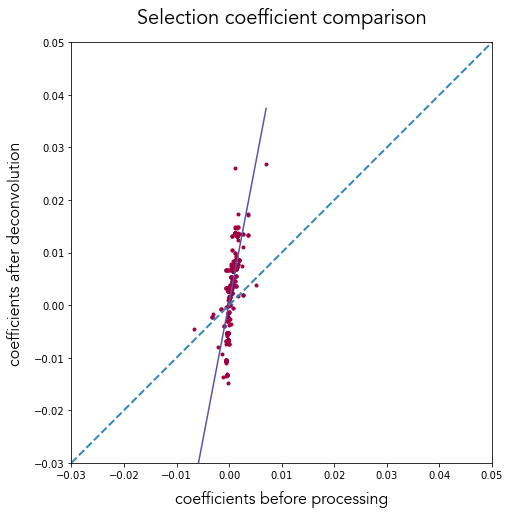

LinregressResult(slope=5.242413445421102, intercept=0.0005368459464822001, rvalue=0.7177039191323045, pvalue=1.7137291902479058e-131, stderr=0.17730158218307998, intercept_stderr=0.0001472846349890924)
Enter region or 'q' to quit (case-insensitive): q


In [10]:
get_region_plots()

note: this plot takes too long to generate, but it will label individual mutations after a while

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.stats import linregress

cmap = cm.get_cmap('Spectral')
rgba1 = cmap(0)
rgba2 = cmap(0.25)
rgba3 = cmap(0.5)
rgba4 = cmap(0.75)
rgba5 = cmap(0.9)
rgba6 = cmap(0.99) 

#home_dir           = '/Users/liz/Documents/GitHub/paper-epi-backprojection/data/analysis-visualization'
#africa_covar_home = os.path.join(home_dir, 'bp-covar', 'africa-south-africa', 'africa-south-africa-1')
#os.chdir(africa_covar_home)

#y = np.load("africa-south-africa---2020-4-19-2022-11-20.npz", allow_pickle=True)

ref_sites = y['ref_sites']
NUC     = ['-', 'A', 'C', 'G', 'T']

new_labels = []
for i in ref_sites:
    for j in NUC:
        new_labels.append(str(i) + '-' + j)
#340 ref sites

cmap = plt.get_cmap('Spectral')

num_lines = y['counts'].shape[1]
norm = plt.Normalize(0, num_lines - 1)
scalar_map = cm.ScalarMappable(norm=norm, cmap=cmap)

for i in range(num_lines):
    x_line = y['times']
    y_line = y['counts'][:, i]
    color = scalar_map.to_rgba(i)
    plt.gcf().set_size_inches(15, 6)
    plt.plot(x_line, y_line, label=new_labels[i], color=color)
    plt.gca().set_xlabel('time', color='white')
    plt.gca().set_ylabel('frequency',color='white')
ax = plt.gca()
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

plt.ylabel('frequency', color='white')
plt.title("unprocessed",color='white')
plt.legend(loc='right')
plt.show()

In [ ]:
# to do: set optional flag for x limit (right now the time is selected ad hoc)

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.cm as cm
import datetime
import numpy as np

def plot_saf_covar(x, y, label):
    ref_date = datetime.date(2020, 1, 1)
    x_days = [int(day) for day in x]
    x_dates = [ref_date + datetime.timedelta(days=day) for day in x_days] 
    
    # Define the date range to mask out
    mask_start = datetime.date(2021, 11, 1)
    mask_end = datetime.date(2021, 11, 11)
    
    # Apply mask by setting values in the y array to NaN for the given date range
    masked_y = y.copy()
    for i, date in enumerate(x_dates):
        if mask_start <= date <= mask_end:
            masked_y[i, :] = np.nan  # Set entire row to NaN for each line at this date

    num_lines = y.shape[1]
    cmap = plt.get_cmap('Spectral')
    norm = plt.Normalize(0, num_lines - 1)
    scalar_map = cm.ScalarMappable(norm=norm, cmap=cmap)

    fig, ax = plt.subplots(figsize=(10, 4))
    for i in range(num_lines):
        y_line = masked_y[:, i]  # Use masked data
        color = scalar_map.to_rgba(i)
        ax.plot(x_dates, y_line, linewidth=1.4, color=color)
    
    plt.subplots_adjust(bottom=0.15)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d-%y'))
    fig.autofmt_xdate()

    ax.set_xlabel('times', font='Avenir', size=16, labelpad=10)
    ax.set_ylabel('allele frequency', font='Avenir', size=16, labelpad=10)
    
    # Set x-axis limits
    start_date = ref_date + datetime.timedelta(days=650)
    end_date = ref_date + datetime.timedelta(days=700)
    ax.set_xlim(start_date, end_date)
    
    plt.title(f'frequency trajectories {label}', font='Avenir', size=20, pad=20)
    plt.show()
    
    return fig

825
['209--', '209-A', '209-C', '209-G', '209-T', '240--', '240-A', '240-C', '240-G', '240-T', '568--', '568-A', '568-C', '568-G', '568-T', '1058--', '1058-A', '1058-C', '1058-G', '1058-T', '1190--', '1190-A', '1190-C', '1190-G', '1190-T', '1266--', '1266-A', '1266-C', '1266-G', '1266-T', '2831--', '2831-A', '2831-C', '2831-G', '2831-T', '3036--', '3036-A', '3036-C', '3036-G', '3036-T', '4180--', '4180-A', '4180-C', '4180-G', '4180-T', '5183--', '5183-A', '5183-C', '5183-G', '5183-T', '5385--', '5385-A', '5385-C', '5385-G', '5385-T', '5541--', '5541-A', '5541-C', '5541-G', '5541-T', '6401--', '6401-A', '6401-C', '6401-G', '6401-T', '6512--', '6512-A', '6512-C', '6512-G', '6512-T', '6513--', '6513-A', '6513-C', '6513-G', '6513-T', '6514--', '6514-A', '6514-C', '6514-G', '6514-T', '7123--', '7123-A', '7123-C', '7123-G', '7123-T', '8392--', '8392-A', '8392-C', '8392-G', '8392-T', '8985--', '8985-A', '8985-C', '8985-G', '8985-T', '9052--', '9052-A', '9052-C', '9052-G', '9052-T', '9890--', 

(<Figure size 720x288 with 1 Axes>, <Figure size 720x288 with 1 Axes>)

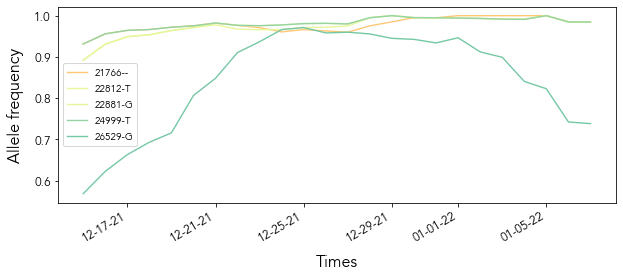

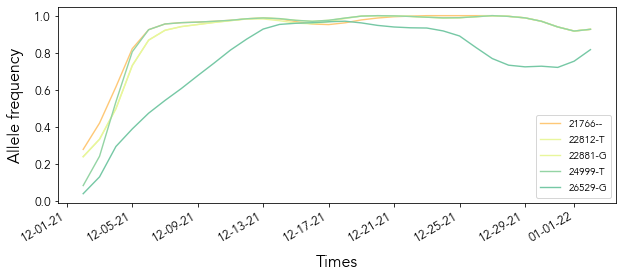

In [48]:
def plot_single_covar(x, y, z, plot_label):
    
    mpl.rc('font', family='Avenir')
    
    csv_file = os.path.join(data_dir, 'ref-index-2024-01-26.csv')
    ref = pd.read_csv(csv_file)
    df = pd.DataFrame(ref)
    
    sites = z
    NUC     = ['-', 'A', 'C', 'G', 'T']
    new_labels = []
    for i in sites:
        for j in NUC:
            new_labels.append(str(i) + '-' + j)      
    index_drop = []

    ref_index_set = set(map(str, sites))
    df = df[df['ref_index'].astype(str).isin(ref_index_set)]

    df = df[~df['ref_index'].isin(index_drop)]

    df['combined'] = df['ref_index'].str.cat(df['nucleotide'], sep='-')

    ref_labels = []
    for i in enumerate(df['combined']):
        ref_labels.append(i[1])
    st = set(ref_labels)
    indices = [i for i, e in enumerate(new_labels) if e in st]
    
    ref_date = datetime.date(2020, 1, 1)
    x_days = [int(day) for day in x]
    x_dates = [ref_date + datetime.timedelta(days=day) for day in x_days] 
    
    num_lines = y.shape[1]

    cmap = plt.get_cmap('Spectral')
    norm = plt.Normalize(0, num_lines - 1)
    scalar_map = cm.ScalarMappable(norm=norm, cmap=cmap)

    fig, ax = plt.subplots(figsize=(10, 4))
    
    #for i in range(num_lines):
    print(num_lines)
    print(new_labels)
    # plot2: i_selected = [64,  84,  94,  99, 124, 128, 178, 264, 819]
    #plot107
    #i_selected = [85,   86,   88,   89,  790,  791,  793,  794,  844, 1031]
    #i_selected = [89,  794, 1031]
    #4
    i_selected = [290, 484, 488, 604, 638]
    for i in i_selected:
        if i not in indices:
            x_line = x
            y_line = y[:, i]
            color = scalar_map.to_rgba(i)
            ax.plot(x_dates, y_line, label=new_labels[i], linewidth=1.4, color=color)
    
    plt.subplots_adjust(bottom=0.15)
    
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d-%y'))
    fig.autofmt_xdate()

    ax.set_xlabel('Times', font='Avenir', size=16, labelpad=10)
    ax.set_ylabel('Allele frequency', font='Avenir', size=16, labelpad=10)
    
    ref_sites = extract_numeric(z)
    #percentiles = np.percentile(ref_sites, [0, 25, 50, 75, 100])
    norm_cbar = Normalize(vmin=min(ref_sites), vmax=max(ref_sites))
    scalar_map = cm.ScalarMappable(norm=norm_cbar, cmap=cmap)
    
    #divider = make_axes_locatable(ax)
    #cax = divider.append_axes("right", size="5%", pad=0.2)
    #cbar = plt.colorbar(scalar_map, cax=cax)
    
    #cbar.set_label('Mutation sites', font='Avenir', size=16, labelpad=20)
    #cbar.set_ticks(percentiles)
    #cbar.set_ticklabels([f'{int(p)}' for p in percentiles])
    
    #for label in cbar.ax.get_yticklabels():
    #    label.set_fontname('Avenir')
    #    label.set_fontsize(12)

    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Avenir')
    
    plt.legend()

    #save_path = f'/Users/liz/Documents/GitHub/paper-epi-backprojection/figures/covar_ppt_{plot_label}.pdf'
    #print(f"saving plot to: {save_path}")
    #plt.savefig(save_path, dpi=300, bbox_inches='tight')

    return fig

def covar_single_figure(index, home_dir):
    un_covar_home = os.path.join(home_dir, 'genome-covar')
    bp_covar_home = os.path.join(home_dir, 'bp-covar')
    
    un_cov_dir = []
    bp_cov_dir = []

    for d in os.listdir(un_covar_home):
        if ".DS_Store" in d:
            continue
        sub_dir = os.path.join(un_covar_home, d)
        for sd in os.listdir(sub_dir):
            if ".DS_Store" in sd:
                continue
            plot_dir = os.path.join(sub_dir, sd)
            un_cov_dir.append(plot_dir)

    for d in os.listdir(bp_covar_home):
        if ".DS_Store" in d:
            continue
        sub_dir = os.path.join(bp_covar_home, d)
        for sd in os.listdir(sub_dir):
            if ".DS_Store" in sd:
                continue
            plot_dir = os.path.join(sub_dir, sd)
            bp_cov_dir.append(plot_dir)

    un_cov_dir = sorted(un_cov_dir)
    bp_cov_dir = sorted(bp_cov_dir)

    un_sel_x, un_sel_y, un_ref_z = load_npz_covar(un_cov_dir[index])
    bp_sel_x, bp_sel_y, bp_ref_z = load_npz_covar(bp_cov_dir[index])

    fig1 = plot_single_covar(un_sel_x, un_sel_y, un_ref_z, f'Transmissions_{index}')
    fig2 = plot_single_covar(bp_sel_x, bp_sel_y, bp_ref_z, f'Inferred_Infections_{index}')
    return fig1, fig2

#covar_single_figure(2, home_dir)
#covar_single_figure(107, home_dir)
covar_single_figure(4, home_dir)

In [41]:
def plot_single_inf(x, y, mut1, mut2, index):
    
    #plt.subplots(figsize=(12,12))
    plt.subplots(figsize=(8,8))
    y_val = y > 0.015
    indices_where = np.where(y_val)
    print(indices_where)
    #mutant = input(str("type mutation: "))
    print(mut1[0][indices_where])
    for i in indices_where:
        plt.plot(x[i], y[i], 'o', label=mut2, color=rgba1, markersize=3)
        plt.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)), color=rgba6)

    ax = plt.gca()
    ax.plot([0, 1], [0, 1], transform=ax.transAxes, color=rgba5,linestyle='dashed',linewidth=2)
    ax.set_xlim(xmin=-.03, xmax=.05)
    ax.set_ylim(ymin=-.03, ymax=.05)

    ax.set_xlabel('Coefficients, sample collection times', font='Avenir', size=16, labelpad=10)
    ax.set_ylabel('Coefficients, inferred infection times', font='Avenir', size=16, labelpad=10)
    plt.title('Selection coefficients comparison', font='Avenir', size=20, pad=20)
    plt.subplots_adjust(bottom=0.15)

    ax.set_aspect('equal', adjustable='box')
    
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Avenir')
        
    plt.show()
    
    print(linregress(x, y))
    
def inf_single_figure(index, inf_plot_home, inf_plot_bp_home, plot_function):
     
    sorted_inf_files = sorted(f for f in os.listdir(inf_plot_home) if f != ".DS_Store")
    sorted_bp_files = sorted(f for f in os.listdir(inf_plot_bp_home) if f != ".DS_Store")
    
    inf_file = sorted_inf_files[index]
    x = np.load(os.path.join(inf_plot_home, inf_file), allow_pickle=True)

    inf_bp_file = sorted_bp_files[index]
    y = np.load(os.path.join(inf_plot_bp_home, inf_bp_file), allow_pickle=True)
    #for file in y:
    #    print(file)
    
    #print(len(y['mutant_sites'][0]))
    un_sel = x['selection']
    bp_sel = y['selection']
    
    un_mut = x['mutant_sites']
    bp_mut = y['mutant_sites']
    
    fig3 = plot_function(un_sel, bp_sel, un_mut, bp_mut, index)
    return fig3

#inf_single_figure(2, inf_plot_home, inf_plot_bp_home, plot_single_inf)

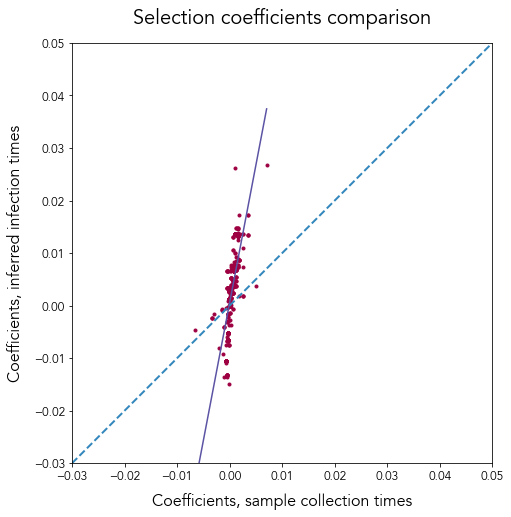

LinregressResult(slope=5.242413445421102, intercept=0.0005368459464822001, rvalue=0.7177039191323045, pvalue=1.7137291902479058e-131, stderr=0.17730158218307998, intercept_stderr=0.0001472846349890924)


In [45]:
inf_figure(4, inf_plot_home, inf_plot_bp_home, plot_inf)

(array([290, 484, 488, 604, 638]),)
['21766--' '22812-T' '22881-G' '24999-T' '26529-G']


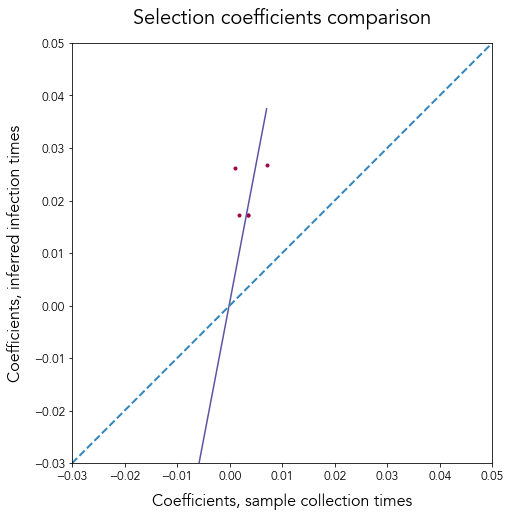

LinregressResult(slope=5.242413445421102, intercept=0.0005368459464822001, rvalue=0.7177039191323045, pvalue=1.7137291902479058e-131, stderr=0.17730158218307998, intercept_stderr=0.0001472846349890924)


In [46]:
inf_single_figure(4, inf_plot_home, inf_plot_bp_home, plot_single_inf)

(array([  89,  794, 1031]),)
['2469-T' '21594-T' '22598-A']


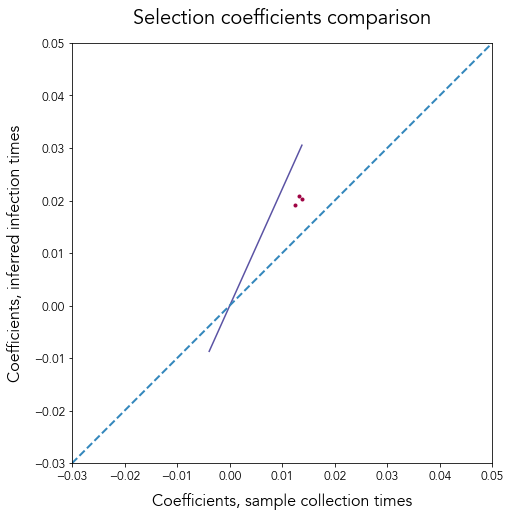

LinregressResult(slope=2.222984589452873, intercept=-5.1621537102829835e-05, rvalue=0.8824821056346607, pvalue=0.0, stderr=0.028668438590459727, intercept_stderr=3.4159427989405915e-05)


In [49]:
inf_single_figure(107, inf_plot_home, inf_plot_bp_home, plot_single_inf)

1710
['202--', '202-A', '202-C', '202-G', '202-T', '209--', '209-A', '209-C', '209-G', '209-T', '240--', '240-A', '240-C', '240-G', '240-T', '831--', '831-A', '831-C', '831-G', '831-T', '912--', '912-A', '912-C', '912-G', '912-T', '1058--', '1058-A', '1058-C', '1058-G', '1058-T', '1190--', '1190-A', '1190-C', '1190-G', '1190-T', '1266--', '1266-A', '1266-C', '1266-G', '1266-T', '1415--', '1415-A', '1415-C', '1415-G', '1415-T', '1819--', '1819-A', '1819-C', '1819-G', '1819-T', '1926--', '1926-A', '1926-C', '1926-G', '1926-T', '1956--', '1956-A', '1956-C', '1956-G', '1956-T', '2109--', '2109-A', '2109-C', '2109-G', '2109-T', '2257--', '2257-A', '2257-C', '2257-G', '2257-T', '2275--', '2275-A', '2275-C', '2275-G', '2275-T', '2345--', '2345-A', '2345-C', '2345-G', '2345-T', '2394--', '2394-A', '2394-C', '2394-G', '2394-T', '2469--', '2469-A', '2469-C', '2469-G', '2469-T', '2596--', '2596-A', '2596-C', '2596-G', '2596-T', '2831--', '2831-A', '2831-C', '2831-G', '2831-T', '3036--', '3036-A',

(<Figure size 720x288 with 1 Axes>, <Figure size 720x288 with 1 Axes>)

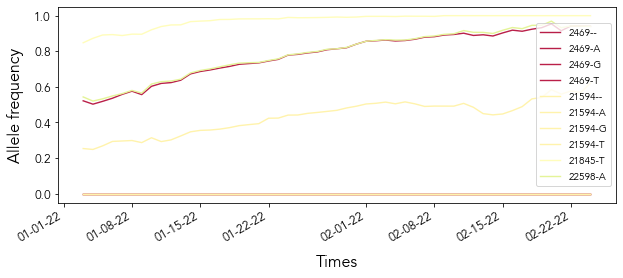

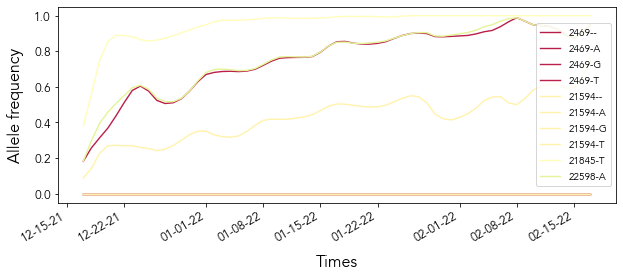

In [54]:
def plot_single_covar(x, y, z, plot_label):
    
    mpl.rc('font', family='Avenir')
    
    csv_file = os.path.join(data_dir, 'ref-index-2024-01-26.csv')
    ref = pd.read_csv(csv_file)
    df = pd.DataFrame(ref)
    
    sites = z
    NUC     = ['-', 'A', 'C', 'G', 'T']
    new_labels = []
    for i in sites:
        for j in NUC:
            new_labels.append(str(i) + '-' + j)      
    index_drop = []

    ref_index_set = set(map(str, sites))
    df = df[df['ref_index'].astype(str).isin(ref_index_set)]

    df = df[~df['ref_index'].isin(index_drop)]

    df['combined'] = df['ref_index'].str.cat(df['nucleotide'], sep='-')

    ref_labels = []
    for i in enumerate(df['combined']):
        ref_labels.append(i[1])
    st = set(ref_labels)
    indices = [i for i, e in enumerate(new_labels) if e in st]
    
    ref_date = datetime.date(2020, 1, 1)
    x_days = [int(day) for day in x]
    x_dates = [ref_date + datetime.timedelta(days=day) for day in x_days] 
    
    num_lines = y.shape[1]

    cmap = plt.get_cmap('Spectral')
    norm = plt.Normalize(0, num_lines - 1)
    scalar_map = cm.ScalarMappable(norm=norm, cmap=cmap)

    fig, ax = plt.subplots(figsize=(10, 4))
    
    #for i in range(num_lines):
    print(num_lines)
    print(new_labels)
    # plot2: i_selected = [64,  84,  94,  99, 124, 128, 178, 264, 819]
    #plot107
    i_selected = [85,   86,   88,   89,  790,  791,  793,  794,  844, 1031]
    #i_selected = [89,  794, 1031]
    #4
    #i_selected = [290, 484, 488, 604, 638]
    for i in i_selected:
        if i not in indices:
            x_line = x
            y_line = y[:, i]
            color = scalar_map.to_rgba(i)
            ax.plot(x_dates, y_line, label=new_labels[i], linewidth=1.4, color=color)
    
    plt.subplots_adjust(bottom=0.15)
    
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d-%y'))
    fig.autofmt_xdate()

    ax.set_xlabel('Times', font='Avenir', size=16, labelpad=10)
    ax.set_ylabel('Allele frequency', font='Avenir', size=16, labelpad=10)
    
    ref_sites = extract_numeric(z)
    #percentiles = np.percentile(ref_sites, [0, 25, 50, 75, 100])
    norm_cbar = Normalize(vmin=min(ref_sites), vmax=max(ref_sites))
    scalar_map = cm.ScalarMappable(norm=norm_cbar, cmap=cmap)
    
    #divider = make_axes_locatable(ax)
    #cax = divider.append_axes("right", size="5%", pad=0.2)
    #cbar = plt.colorbar(scalar_map, cax=cax)
    
    #cbar.set_label('Mutation sites', font='Avenir', size=16, labelpad=20)
    #cbar.set_ticks(percentiles)
    #cbar.set_ticklabels([f'{int(p)}' for p in percentiles])
    
    #for label in cbar.ax.get_yticklabels():
    #    label.set_fontname('Avenir')
    #    label.set_fontsize(12)

    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Avenir')
    
    plt.legend()

    #save_path = f'/Users/liz/Documents/GitHub/paper-epi-backprojection/figures/covar_ppt_{plot_label}.pdf'
    #print(f"saving plot to: {save_path}")
    #plt.savefig(save_path, dpi=300, bbox_inches='tight')

    return fig

def covar_single_figure(index, home_dir):
    un_covar_home = os.path.join(home_dir, 'genome-covar')
    bp_covar_home = os.path.join(home_dir, 'bp-covar')
    
    un_cov_dir = []
    bp_cov_dir = []

    for d in os.listdir(un_covar_home):
        if ".DS_Store" in d:
            continue
        sub_dir = os.path.join(un_covar_home, d)
        for sd in os.listdir(sub_dir):
            if ".DS_Store" in sd:
                continue
            plot_dir = os.path.join(sub_dir, sd)
            un_cov_dir.append(plot_dir)

    for d in os.listdir(bp_covar_home):
        if ".DS_Store" in d:
            continue
        sub_dir = os.path.join(bp_covar_home, d)
        for sd in os.listdir(sub_dir):
            if ".DS_Store" in sd:
                continue
            plot_dir = os.path.join(sub_dir, sd)
            bp_cov_dir.append(plot_dir)

    un_cov_dir = sorted(un_cov_dir)
    bp_cov_dir = sorted(bp_cov_dir)

    un_sel_x, un_sel_y, un_ref_z = load_npz_covar(un_cov_dir[index])
    bp_sel_x, bp_sel_y, bp_ref_z = load_npz_covar(bp_cov_dir[index])

    fig1 = plot_single_covar(un_sel_x, un_sel_y, un_ref_z, f'Transmissions_{index}')
    fig2 = plot_single_covar(bp_sel_x, bp_sel_y, bp_ref_z, f'Inferred_Infections_{index}')
    return fig1, fig2

#covar_single_figure(2, home_dir)
covar_single_figure(107, home_dir)
#covar_single_figure(4, home_dir)